# San Francisco Crime Analysis and Classifier:

Hi folks!, Welcome to one new project in which we will build a classifier based on traditional ML models to predict the crime category given 8 characteristics, nevertheless is the exhaustive EDA we had to perform in order to create a proper data, with no more to say, let's get started!

From 1934 to 1963, San Francisco was infamous for housing some of the world's most notorious criminals on the inescapable island of Alcatraz. Today, the city is known more for its tech scene than its criminal past. But, with rising wealth inequality, housing shortages, and a proliferation of expensive digital toys riding BART to work, there is no scarcity of crime in the city by the bay. From Sunset to SOMA, and Marina to Excelsior, this project analyzes 12 years of crime reports from across all of San Francisco's neighborhoods to create a model that predicts the category of crime that occurred given time and location.


**Problem Statement**

To examine the specific problem, we will apply a full Data Science life cycle composed of the following steps:

- Data Exploration in which we will clean and understand the variables and how they relate between each other obtaining key insights that help us enhance the pre-modeling process of our data.
- Feature Engineering to create additional features derived from the existing ones.
- Training / Testing data creation to evaluate the performance of our models and fine-tune their hyperparameters.

**Data fields**

- Dates - timestamp of the crime incident
- Category - category of the crime incident (only in train.csv). This is the target variable you are going to predict.
- Descript - detailed description of the crime incident (only in train.csv)
- DayOfWeek - the day of the week
- PdDistrict - name of the Police Department District
- Resolution - how the crime incident was resolved (only in train.csv)
- Address - the approximate street address of the crime incident 
- X - Longitude
- Y - Latitude

## Exploratory data analysis

We will start by displaying the files contained in the dataset and unzip them so as to be proper to be used in our notebook.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
base_dir = "Project_1"
train_dir = os.path.join(base_dir, "train.csv")
test_dir = os.path.join(base_dir, "test.csv")
submission_dir = os.path.join(base_dir, "sampleSubmission.csv")

'''import zipfile
with zipfile.ZipFile(train_dir,"r") as train:
    train.extractall()

with zipfile.ZipFile(test_dir,"r") as test:
    test.extractall()

with zipfile.ZipFile(submission_dir,"r") as sub:
    sub.extractall()'''

'import zipfile\nwith zipfile.ZipFile(train_dir,"r") as train:\n    train.extractall()\n\nwith zipfile.ZipFile(test_dir,"r") as test:\n    test.extractall()\n\nwith zipfile.ZipFile(submission_dir,"r") as sub:\n    sub.extractall()'

In [4]:
df=pd.read_csv('./train.csv')

In [5]:
df.shape

(878049, 9)

In [6]:
df.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


Here we can see both files contain over 870 thousand instances and the testing set considers only 7 features which can be seen below: 

In [7]:
df_test=pd.read_csv('./test.csv')
df_test.shape

(884262, 7)

In [8]:
df_test.head()

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


Below we can see the number of null values in our columns and the type of them, this step is important to perform early in order to set these columns to their proper type and do some basic cleaning.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   Descript    878049 non-null  object 
 3   DayOfWeek   878049 non-null  object 
 4   PdDistrict  878049 non-null  object 
 5   Resolution  878049 non-null  object 
 6   Address     878049 non-null  object 
 7   X           878049 non-null  float64
 8   Y           878049 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


There is not null values, they are all set properly excepting the Date column which has to be set as Datetime type, we will do this in the next lines:

In [10]:
df.isna().sum()

Dates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64

As we have only 2 numeric columns the describe function will be performed only on these two:

In [11]:
df.describe()

,X,Y
count,878049.000000,878049.000000
mean,-122.422616,37.771020
std,0.030354,0.456893
min,-122.513642,37.707879
25%,-122.432952,37.752427
50%,-122.416420,37.775421
75%,-122.406959,37.784369
max,-120.500000,90.000000


From other notebook I have noticed these features contain outliers corresponding to coordinates (latitude and longitude) that does not correspond to San Francisco rather to North Pole, this is why we will get rid of them, but firstly let's display such instances:

In [12]:
df[df['X']>=-120.5]

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
660485,2005-12-30 17:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Friday,TENDERLOIN,NONE,5THSTNORTH ST / OFARRELL ST,-120.5,90.0
660711,2005-12-30 00:34:00,ASSAULT,INFLICT INJURY ON COHABITEE,Friday,BAYVIEW,"ARREST, BOOKED",JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0
660712,2005-12-30 00:34:00,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Friday,BAYVIEW,"ARREST, BOOKED",JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0
661106,2005-12-29 00:07:00,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Thursday,TENDERLOIN,PSYCHOPATHIC CASE,5THSTNORTH ST / EDDY ST,-120.5,90.0
666430,2005-11-30 11:25:00,OTHER OFFENSES,TRAFFIC VIOLATION,Wednesday,TENDERLOIN,"ARREST, CITED",5THSTNORTH ST / ELLIS ST,-120.5,90.0
...,...,...,...,...,...,...,...,...,...
844995,2003-06-11 08:49:00,OTHER OFFENSES,"DRIVERS LICENSE, SUSPENDED OR REVOKED",Wednesday,INGLESIDE,"ARREST, CITED",JAMES LICK FREEWAY HY / CESAR CHAVEZ ST,-120.5,90.0
845842,2003-06-09 09:25:00,OTHER OFFENSES,"DRIVERS LICENSE, SUSPENDED OR REVOKED",Monday,INGLESIDE,"ARREST, CITED",JAMES LICK FREEWAY HY / CESAR CHAVEZ ST,-120.5,90.0
852880,2003-05-02 01:00:00,SEX OFFENSES FORCIBLE,"FORCIBLE RAPE, BODILY FORCE",Friday,SOUTHERN,COMPLAINANT REFUSES TO PROSECUTE,3RD ST / JAMES LICK FREEWAY HY,-120.5,90.0
857248,2003-04-14 16:30:00,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Monday,BAYVIEW,COMPLAINANT REFUSES TO PROSECUTE,GILMAN AV / FITCH ST,-120.5,90.0


**Official extreme coordinates:** Correspond to the original extreme coordinates of the San Francisco map, these will help us to narrow down the intervals coordinates so as to be more accuracte in our plottings.

**min_longitude, min_latitude, max_longitude, max_latitude = -122.52469 37.69862 -122.33663 37.82986**

**Box = (-122.52469, -122.33663, 37.69862, 37.82986)**

In [13]:
df = df[df['X']<-120.5]
df.describe()

,X,Y
count,877982.000000,877982.000000
mean,-122.422763,37.767035
std,0.025285,0.024165
min,-122.513642,37.707879
25%,-122.432952,37.752427
50%,-122.416420,37.775421
75%,-122.406959,37.784368
max,-122.364937,37.819975


In [14]:
df.shape

(877982, 9)

Once we got rid of those instances in the describe table we can see the X and Y minimum and maximum are shortened which means they comprehend the region around SF. Now we will set the Date feature to datetime type allowing us to perform time series analysis.

In [15]:
df['Dates'] =  pd.to_datetime(df['Dates'], infer_datetime_format=True)
df.info()

/home/u213931/tmp/ipykernel_3239276/773883810.py:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['Dates'] =  pd.to_datetime(df['Dates'], infer_datetime_format=True)


<class 'pandas.core.frame.DataFrame'>
Index: 877982 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Dates       877982 non-null  datetime64[ns]
 1   Category    877982 non-null  object        
 2   Descript    877982 non-null  object        
 3   DayOfWeek   877982 non-null  object        
 4   PdDistrict  877982 non-null  object        
 5   Resolution  877982 non-null  object        
 6   Address     877982 non-null  object        
 7   X           877982 non-null  float64       
 8   Y           877982 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(6)
memory usage: 67.0+ MB


Another very important detail about the data is that it contains duplicated instances, we have to eliminate them in order to avoid unuseful/insignificant data:

In [16]:
len(df[df.duplicated()])

2323

In [17]:
df.drop_duplicates(inplace=True)
len(df)

875659

Once we have made a basic processing we can start exploring our label and features:

In [18]:
df.Category.unique()

array(['WARRANTS', 'OTHER OFFENSES', 'LARCENY/THEFT', 'VEHICLE THEFT',
       'VANDALISM', 'NON-CRIMINAL', 'ROBBERY', 'ASSAULT', 'WEAPON LAWS',
       'BURGLARY', 'SUSPICIOUS OCC', 'DRUNKENNESS',
       'FORGERY/COUNTERFEITING', 'DRUG/NARCOTIC', 'STOLEN PROPERTY',
       'SECONDARY CODES', 'TRESPASS', 'MISSING PERSON', 'FRAUD',
       'KIDNAPPING', 'RUNAWAY', 'DRIVING UNDER THE INFLUENCE',
       'SEX OFFENSES FORCIBLE', 'PROSTITUTION', 'DISORDERLY CONDUCT',
       'ARSON', 'FAMILY OFFENSES', 'LIQUOR LAWS', 'BRIBERY',
       'EMBEZZLEMENT', 'SUICIDE', 'LOITERING',
       'SEX OFFENSES NON FORCIBLE', 'EXTORTION', 'GAMBLING', 'BAD CHECKS',
       'TREA', 'RECOVERED VEHICLE', 'PORNOGRAPHY/OBSCENE MAT'],
      dtype=object)

The label contains 39 crime categories, below we will print a bar plot considering the proportion of incidents of each one in relation to the total:

/home/u213931/tmp/ipykernel_3239276/1634181383.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(df.Category.value_counts(normalize=True),


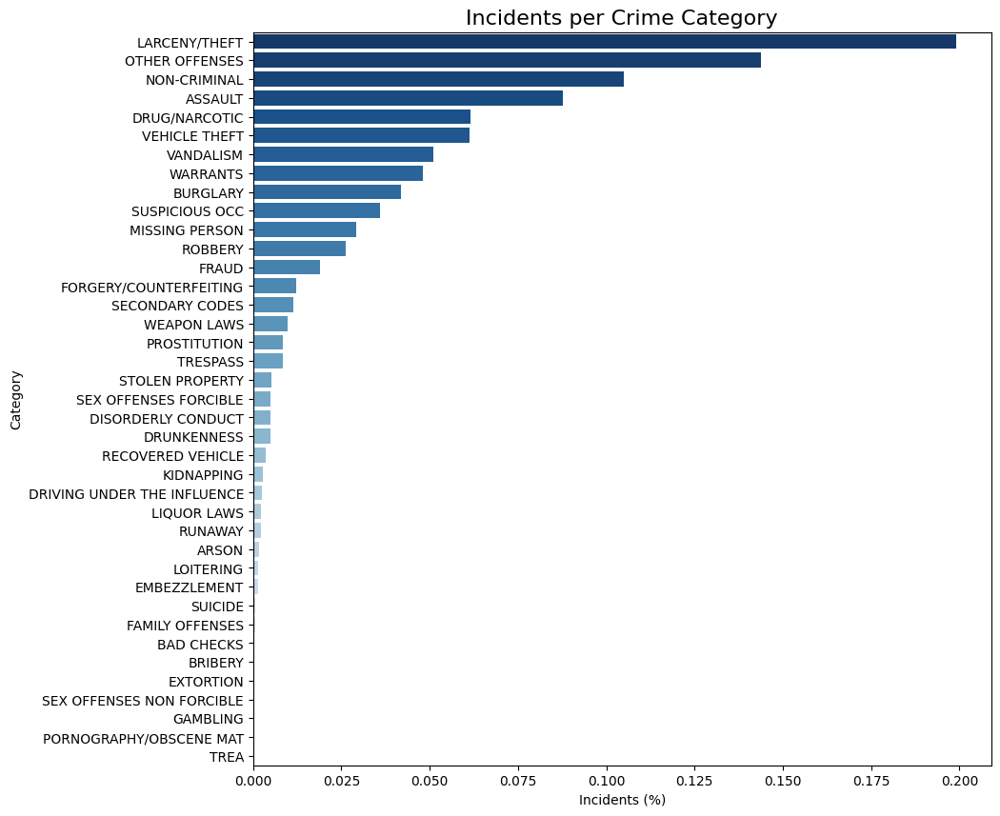

In [19]:
plt.figure(figsize=(10, 10))
sns.barplot(df.Category.value_counts(normalize=True), 
           
            orient='h', palette="Blues_r")
plt.title('Incidents per Crime Category', fontdict={'fontsize': 16})
plt.xlabel('Incidents (%)')

plt.show()

We can plot the distribution of the crime by category on the San Francisco map, but firstly I will read the image obtained from Google maps:

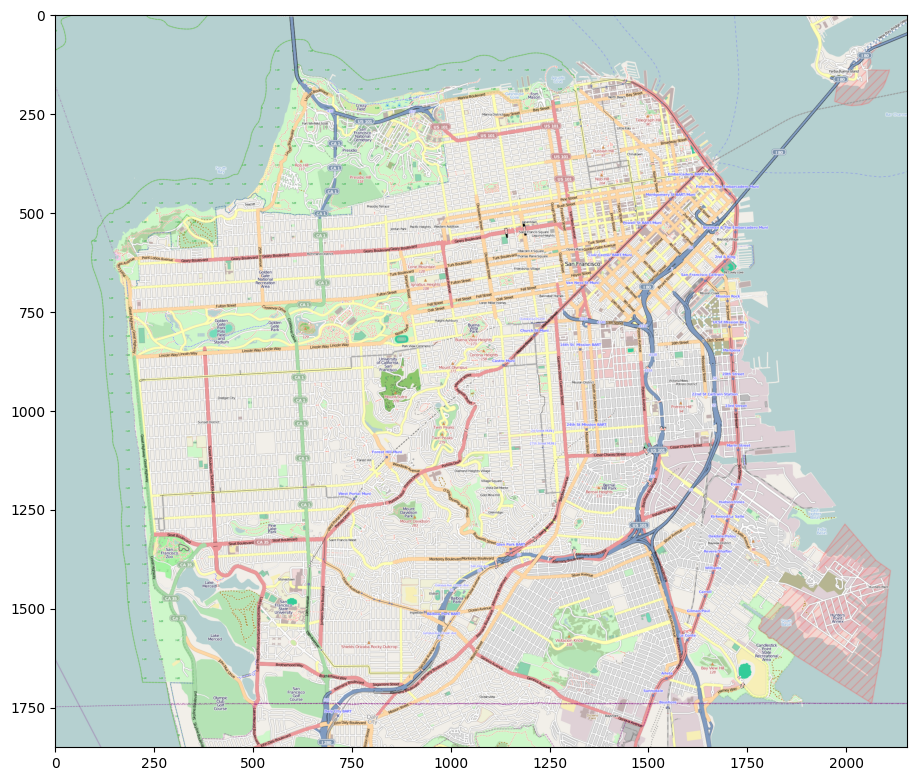

In [20]:
img_map = plt.imread('Location_map_San_Francisco_County.png')
plt.subplots(figsize = (11,11))
plt.imshow(img_map)

As I said earlier the extreme coordinates would help us to set the limits of our map either in latitude and longitude. In the below cell we will plot a heat map of all crimes in the region, take into account that as the data contains more than 800 thousand that would take hours to plot, this is why we will randomly sample and plot 5000 instances:

(-122.52469, -122.33663, 37.69862, 37.82986)

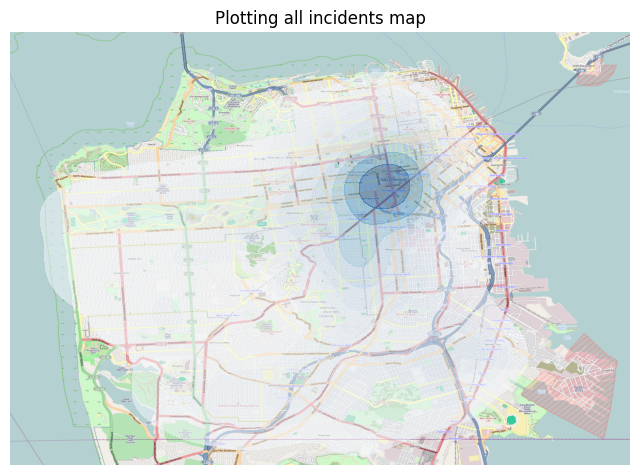

In [21]:
#    ll.lon     ll.lat   ur.lon     ur.lat
#    -122.52469 37.69862 -122.33663 37.82986

BBox = (-122.52469, -122.33663, 37.69862, 37.82986)
fig, ax = plt.subplots(figsize = (8,7))

sns.kdeplot(data=df.sample(5000), x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5)
ax.set_title('Plotting all incidents map')
ax.set_xlim(-122.52469, -122.33663)
ax.set_ylim(37.69862, 37.82986)
ax.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
ax.axis('off')

I have selected 9 crime categories based on their number of incidents and in the next cell we will plot the heat map for each of these crimes (notice again that I have taken a sample of them in order to speed up the process):

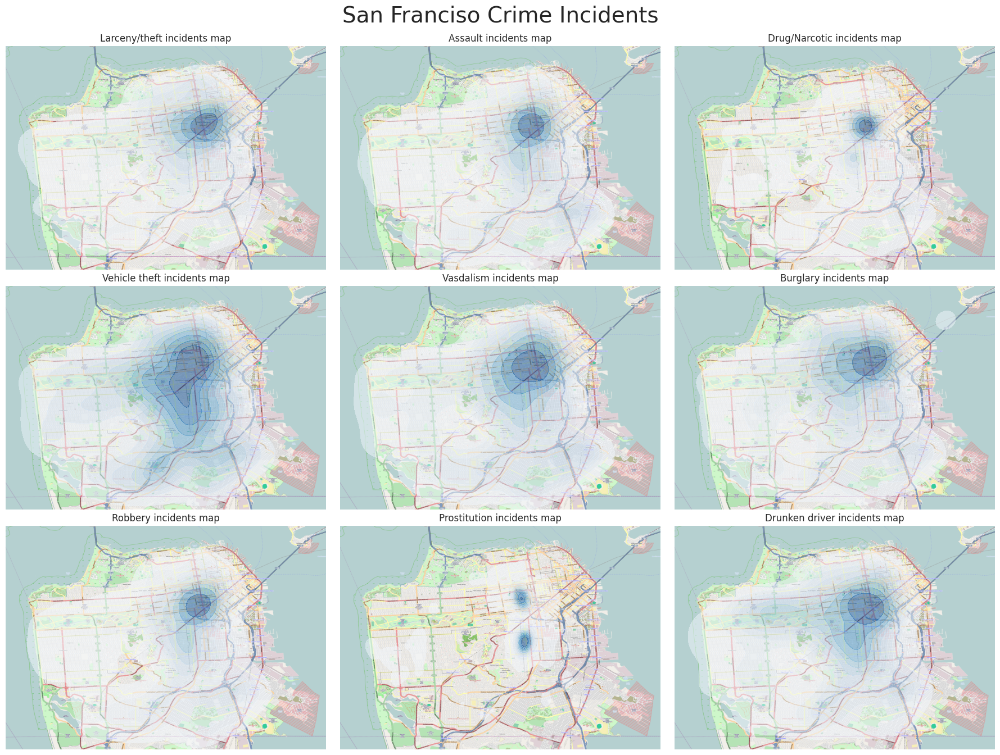

In [22]:
import pylab
import numpy as np

pylab.rcParams['figure.figsize'] = (18.0, 13.0)

larceny = df[df['Category'] == "LARCENY/THEFT"].sample(4000)
assault = df[df['Category'] == "ASSAULT"].sample(4000)
drug = df[df['Category'] == "DRUG/NARCOTIC"].sample(4000)
vehicle = df[df['Category'] == "VEHICLE THEFT"].sample(4000)
vandalism = df[df['Category'] == "VANDALISM"].sample(4000)
burglary = df[df['Category'] == "BURGLARY"].sample(4000)
robbery = df[df['Category'] == "ROBBERY"].sample(4000)
prostitution = df[df['Category'] == "PROSTITUTION"].sample(4000)
driving_drunk = df[df['Category'] == "DRIVING UNDER THE INFLUENCE"]

with plt.style.context('seaborn-darkgrid'):
    ax2 = plt.subplot2grid((3,3), (0, 0))
    ax2.set_title('Larceny/theft incidents map')
    ax2.set_xlim(-122.52469, -122.33663)
    ax2.set_ylim(37.69862, 37.82986)
    ax2.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=larceny, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax2)
    ax2.axis('off')
    
    ax3 = plt.subplot2grid((3,3), (0, 1))
    ax3.set_title('Assault incidents map')
    ax3.set_xlim(-122.52469, -122.33663)
    ax3.set_ylim(37.69862, 37.82986)
    ax3.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=assault, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax3)
    ax3.axis('off')
    
    ax4 = plt.subplot2grid((3,3), (0, 2))
    ax4.set_title('Drug/Narcotic incidents map')
    ax4.set_xlim(-122.52469, -122.33663)
    ax4.set_ylim(37.69862, 37.82986)
    ax4.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=drug, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax4)
    ax4.axis('off')
    
    ax5 = plt.subplot2grid((3,3), (1, 0))
    ax5.set_title('Vehicle theft incidents map')
    ax5.set_xlim(-122.52469, -122.33663)
    ax5.set_ylim(37.69862, 37.82986)
    ax5.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=vehicle[vehicle['Y']<=38], x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax5)
    ax5.axis('off')
    
    ax6 = plt.subplot2grid((3,3), (1, 1))
    ax6.set_title('Vasdalism incidents map')
    ax6.set_xlim(-122.52469, -122.33663)
    ax6.set_ylim(37.69862, 37.82986)
    ax6.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=vandalism, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax6)
    ax6.axis('off')
    
    ax7 = plt.subplot2grid((3,3), (1, 2))
    ax7.set_title('Burglary incidents map')
    ax7.set_xlim(-122.52469, -122.33663)
    ax7.set_ylim(37.69862, 37.82986)
    ax7.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=burglary, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax7)
    ax7.axis('off')

    ax8 = plt.subplot2grid((3,3), (2, 0))
    ax8.set_title('Robbery incidents map')
    ax8.set_xlim(-122.52469, -122.33663)
    ax8.set_ylim(37.69862, 37.82986)
    ax8.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=robbery, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax8)
    ax8.axis('off')
    
    ax9 = plt.subplot2grid((3,3), (2, 1))
    ax9.set_title('Prostitution incidents map')
    ax9.set_xlim(-122.52469, -122.33663)
    ax9.set_ylim(37.69862, 37.82986)
    ax9.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=prostitution, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax9)
    ax9.axis('off')
    
    ax10 = plt.subplot2grid((3,3), (2, 2))
    ax10.set_title('Drunken driver incidents map')
    ax10.set_xlim(-122.52469, -122.33663)
    ax10.set_ylim(37.69862, 37.82986)
    ax10.imshow(img_map, zorder=0, extent = BBox, aspect= 'equal')
    sns.kdeplot(data=driving_drunk, x='X', y='Y', fill=True, thresh=0.02, cmap='Blues', alpha=0.5, ax=ax10)
    ax10.axis('off')
  
    pylab.gcf().text(0.5, 1.03, 
                    'San Franciso Crime Incidents',
                     horizontalalignment='center',
                     verticalalignment='top', 
                     fontsize = 28)
    
plt.tight_layout()
plt.show()

Let's print the amount of unique descriptions in our dataset:

In [23]:
len(df.Descript.unique())

879

In [24]:
df.Descript.unique()[:10]

array(['WARRANT ARREST', 'TRAFFIC VIOLATION ARREST',
       'GRAND THEFT FROM LOCKED AUTO', 'GRAND THEFT FROM UNLOCKED AUTO',
       'STOLEN AUTOMOBILE', 'PETTY THEFT FROM LOCKED AUTO',
       'MISCELLANEOUS INVESTIGATION',
       'MALICIOUS MISCHIEF, VANDALISM OF VEHICLES', 'FOUND PROPERTY',
       'ROBBERY, ARMED WITH A KNIFE'], dtype=object)

This feature is so important and specific that we could obviously use a model based on attention (transformers) and predict the category as such column explain what happened in the event and almost always contains key words to identify the crime category. As this is not considered in the testing file we can go ahead and ignore it.

In [25]:
df.DayOfWeek.unique()

array(['Wednesday', 'Tuesday', 'Monday', 'Sunday', 'Saturday', 'Friday',
       'Thursday'], dtype=object)

Week days column makes sense as it contains from monday to sunday events, later we will see the the distribution of incidents by day.

In [26]:
df.PdDistrict.unique()

array(['NORTHERN', 'PARK', 'INGLESIDE', 'BAYVIEW', 'RICHMOND', 'CENTRAL',
       'TARAVAL', 'TENDERLOIN', 'MISSION', 'SOUTHERN'], dtype=object)

This column represents the police department district, in other words the area of San Francisco that is covered by a specific police department, we can see that southern is the most frequent department requested as more crimes happen in such district.

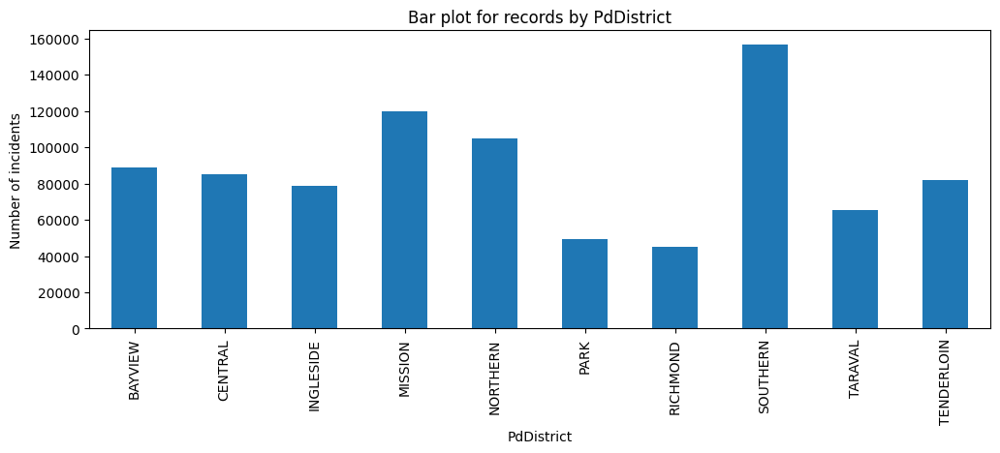

In [27]:
plt.figure(figsize=(12, 4))

df_pd=df.groupby(by='PdDistrict').count()
df_pd.iloc[:,0].plot(kind='bar')
plt.title('Bar plot for records by PdDistrict')
plt.xlabel("PdDistrict")
plt.ylabel("Number of incidents")
plt.show()

In [28]:
df.Resolution.unique()

array(['ARREST, BOOKED', 'NONE', 'ARREST, CITED', 'PSYCHOPATHIC CASE',
       'JUVENILE BOOKED', 'UNFOUNDED', 'EXCEPTIONAL CLEARANCE', 'LOCATED',
       'CLEARED-CONTACT JUVENILE FOR MORE INFO', 'NOT PROSECUTED',
       'JUVENILE DIVERTED', 'COMPLAINANT REFUSES TO PROSECUTE',
       'JUVENILE ADMONISHED', 'JUVENILE CITED',
       'DISTRICT ATTORNEY REFUSES TO PROSECUTE',
       'PROSECUTED BY OUTSIDE AGENCY', 'PROSECUTED FOR LESSER OFFENSE'],
      dtype=object)

There are 17 possible event resolutions and these can not be related to specific crimes, this is why we will ignore it later when defining the features for training:

In [29]:
len(df.Resolution.unique())

17

The address is significatively important as it contains key words of streets that can be related any specific crime such as drug dealing, prostitution, car theft, etc. Later we will see the most frequent words in this column by performing N-gram analysis.

In [30]:
len(df.Address.unique())

23191

Now we will perform time series analysis in which we can find patterns in hours, days, months or even years related to a crime, for this we will extract such components of the date feature which then will be grouped adding up the number of incidents.

In [31]:
df['year'] = pd.to_datetime(df['Dates']).dt.year
df['month'] = pd.to_datetime(df['Dates']).dt.month
df['day'] = pd.to_datetime(df['Dates']).dt.day
df['hour'] = pd.to_datetime(df['Dates']).dt.hour
df.sample(10)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,year,month,day,hour
314960,2011-01-11 02:00:00,ASSAULT,BATTERY,Tuesday,SOUTHERN,NONE,800 Block of BRYANT ST,-122.403405,37.775421,2011,1,11,2
277439,2011-07-31 21:43:00,DRUG/NARCOTIC,POSSESSION OF BASE/ROCK COCAINE,Sunday,NORTHERN,"ARREST, BOOKED",OLIVE ST / LARKIN ST,-122.417809,37.784710,2011,7,31,21
560159,2007-06-15 13:30:00,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Friday,CENTRAL,NONE,700 Block of POST ST,-122.414179,37.787502,2007,6,15,13
491728,2008-06-11 11:15:00,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Wednesday,SOUTHERN,NONE,800 Block of BRYANT ST,-122.403405,37.775421,2008,6,11,11
74642,2014-05-16 20:51:00,FRAUD,FALSE ID TO PEACE OFFICER,Friday,TARAVAL,"ARREST, BOOKED",MORAGA ST / 45TH AV,-122.470967,37.756344,2014,5,16,20
584256,2007-02-06 18:30:00,LARCENY/THEFT,GRAND THEFT BICYCLE,Tuesday,MISSION,NONE,1200 Block of SOUTH VAN NESS AV,-122.416269,37.753159,2007,2,6,18
63932,2014-07-10 12:50:00,NON-CRIMINAL,AIDED CASE -PROPERTY FOR DESTRUCTION,Thursday,RICHMOND,NONE,400 Block of 6TH AV,-122.464280,37.780033,2014,7,10,12
117795,2013-10-16 10:26:00,DRUNKENNESS,UNDER INFLUENCE OF ALCOHOL IN A PUBLIC PLACE,Wednesday,SOUTHERN,NONE,1000 Block of MARKET ST,-122.411340,37.781271,2013,10,16,10
23187,2015-01-22 15:00:00,VEHICLE THEFT,STOLEN TRUCK,Thursday,BAYVIEW,NONE,INGALLS ST / UNDERWOOD AV,-122.386242,37.726606,2015,1,22,15
155913,2013-04-19 19:00:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Friday,NORTHERN,NONE,MARINA BL / LAGUNA ST,-122.432073,37.805222,2013,4,19,19


**Crime ocurrence by hour**

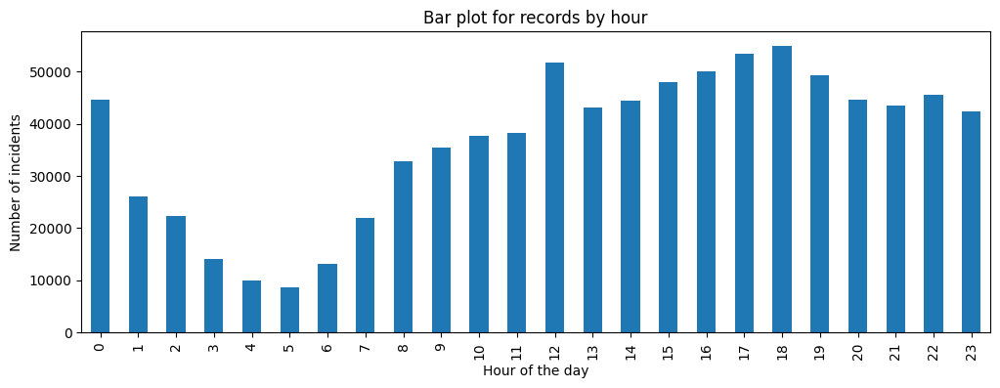

In [32]:
plt.figure(figsize=(12, 4))

hours_event=df.groupby(by='hour').count()
hours_event.iloc[:,0].plot(kind='bar')
plt.title('Bar plot for records by hour')
plt.xlabel("Hour of the day")
plt.ylabel("Number of incidents")
plt.show()

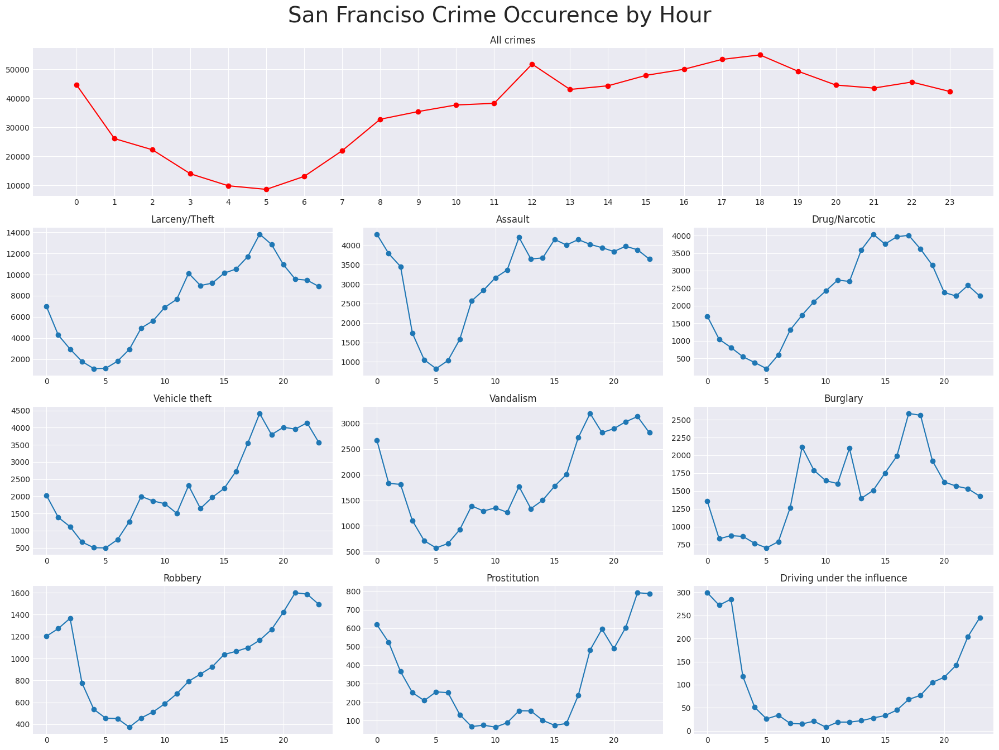

In [33]:
pylab.rcParams['figure.figsize'] = (18.0, 13.0)

larceny = df[df['Category'] == "LARCENY/THEFT"]
assault = df[df['Category'] == "ASSAULT"]
drug = df[df['Category'] == "DRUG/NARCOTIC"]
vehicle = df[df['Category'] == "VEHICLE THEFT"]
vandalism = df[df['Category'] == "VANDALISM"]
burglary = df[df['Category'] == "BURGLARY"]
robbery = df[df['Category'] == "ROBBERY"]
prostitution = df[df['Category'] == "PROSTITUTION"]
driving_drunk = df[df['Category'] == "DRIVING UNDER THE INFLUENCE"]

with plt.style.context('seaborn-darkgrid'):
    ax1 = plt.subplot2grid((4,3), (0, 0), colspan=3)
    ax1.plot(df.groupby('hour').size(), 'ro-')
    ax1.set_title ('All crimes')
    ax1.xaxis.set_ticks(np.arange(0, 24, 1))
    
    ax2 = plt.subplot2grid((4,3), (1, 0))
    ax2.plot(larceny.groupby('hour').size(), 'o-')
    ax2.set_title ('Larceny/Theft')
    
    ax3 = plt.subplot2grid((4,3), (1, 1))
    ax3.plot(assault.groupby('hour').size(), 'o-')
    ax3.set_title ('Assault')
    
    ax4 = plt.subplot2grid((4,3), (1, 2))
    ax4.plot(drug.groupby('hour').size(), 'o-')
    ax4.set_title ('Drug/Narcotic')
    
    ax5 = plt.subplot2grid((4,3), (2, 0))
    ax5.plot(vehicle.groupby('hour').size(), 'o-')
    ax5.set_title ('Vehicle theft')
    
    ax6 = plt.subplot2grid((4,3), (2, 1))
    ax6.plot(vandalism.groupby('hour').size(), 'o-')
    ax6.set_title ('Vandalism')
    
    ax7 = plt.subplot2grid((4,3), (2, 2))
    ax7.plot(burglary.groupby('hour').size(), 'o-')
    ax7.set_title ('Burglary')

    ax8 = plt.subplot2grid((4,3), (3, 0))
    ax8.plot(robbery.groupby('hour').size(), 'o-')
    ax8.set_title ('Robbery')
    
    ax9 = plt.subplot2grid((4,3), (3, 1))
    ax9.plot(prostitution.groupby('hour').size(), 'o-')
    ax9.set_title ('Prostitution')
    
    ax10 = plt.subplot2grid((4,3), (3, 2))
    ax10.plot(driving_drunk.groupby('hour').size(), 'o-')
    ax10.set_title ('Driving under the influence')
  
    pylab.gcf().text(0.5, 1.03, 
                    'San Franciso Crime Occurence by Hour',
                     horizontalalignment='center',
                     verticalalignment='top', 
                     fontsize = 28)
    
plt.tight_layout()
plt.show()

**Crime ocurrence by day of the week**

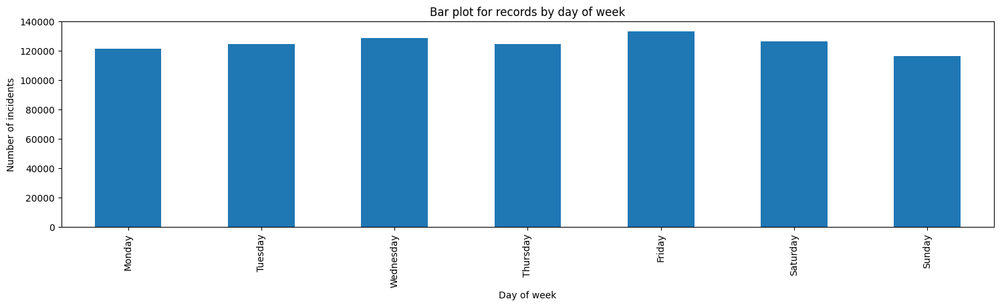

In [34]:
data = df.groupby('DayOfWeek').count().iloc[:, 0]
data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.figure(figsize=(18, 4))
data.plot(kind='bar')
plt.title('Bar plot for records by day of week')
plt.xlabel("Day of week")
plt.ylabel("Number of incidents")
plt.show()

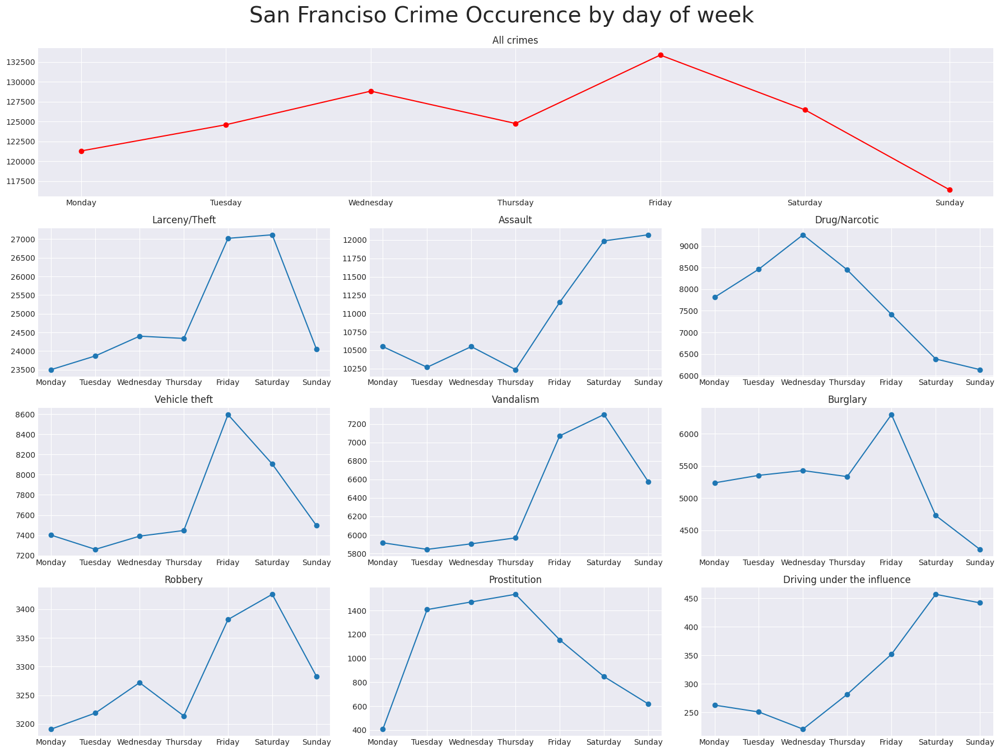

In [35]:
pylab.rcParams['figure.figsize'] = (18.0, 13.0)

larceny = df[df['Category'] == "LARCENY/THEFT"]
assault = df[df['Category'] == "ASSAULT"]
drug = df[df['Category'] == "DRUG/NARCOTIC"]
vehicle = df[df['Category'] == "VEHICLE THEFT"]
vandalism = df[df['Category'] == "VANDALISM"]
burglary = df[df['Category'] == "BURGLARY"]
robbery = df[df['Category'] == "ROBBERY"]
prostitution = df[df['Category'] == "PROSTITUTION"]
driving_drunk = df[df['Category'] == "DRIVING UNDER THE INFLUENCE"]

with plt.style.context('seaborn-darkgrid'):
    ax1 = plt.subplot2grid((4,3), (0, 0), colspan=3)
    data = df.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax1.plot(data, 'ro-')
    ax1.set_title ('All crimes')
    ax1.xaxis.set_ticks(np.arange(0, 7, 1))
    
    ax2 = plt.subplot2grid((4,3), (1, 0))
    data = larceny.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax2.plot(data, 'o-')
    ax2.set_title ('Larceny/Theft')
    
    ax3 = plt.subplot2grid((4,3), (1, 1))
    data = assault.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax3.plot(data, 'o-')
    ax3.set_title ('Assault')
    
    ax4 = plt.subplot2grid((4,3), (1, 2))
    data = drug.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax4.plot(data, 'o-')
    ax4.set_title ('Drug/Narcotic')
    
    ax5 = plt.subplot2grid((4,3), (2, 0))
    data = vehicle.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax5.plot(data, 'o-')
    ax5.set_title ('Vehicle theft')
    
    ax6 = plt.subplot2grid((4,3), (2, 1))
    data = vandalism.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax6.plot(data, 'o-')
    ax6.set_title ('Vandalism')
    
    ax7 = plt.subplot2grid((4,3), (2, 2))
    data = burglary.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax7.plot(data, 'o-')
    ax7.set_title ('Burglary')

    ax8 = plt.subplot2grid((4,3), (3, 0))
    data = robbery.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax8.plot(data, 'o-')
    ax8.set_title ('Robbery')
    
    ax9 = plt.subplot2grid((4,3), (3, 1))
    data = prostitution.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax9.plot(data, 'o-')
    ax9.set_title ('Prostitution')
    
    ax10 = plt.subplot2grid((4,3), (3, 2))
    data = driving_drunk.groupby('DayOfWeek').size()
    data = data.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ax10.plot(data, 'o-')
    ax10.set_title ('Driving under the influence')
  
    pylab.gcf().text(0.5, 1.03, 
                    'San Franciso Crime Occurence by day of week',
                     horizontalalignment='center',
                     verticalalignment='top', 
                     fontsize = 28)
    
plt.tight_layout()
plt.show()

**Crime ocurrence by day of the month**

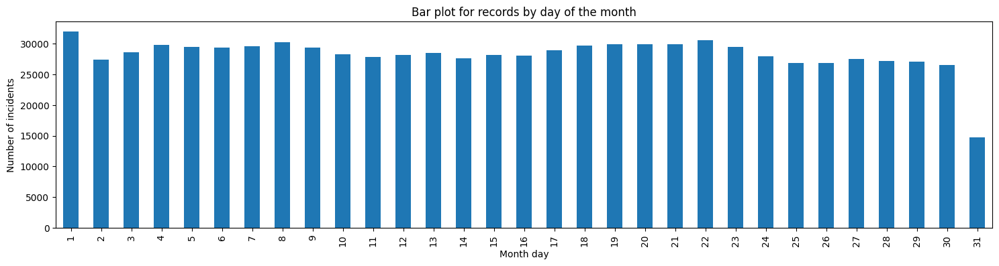

In [36]:
plt.figure(figsize=(18, 4))

days_event=df.groupby(by='day').count()
days_event.iloc[:,0].plot(kind='bar')
plt.title('Bar plot for records by day of the month')
plt.xlabel("Month day")
plt.ylabel("Number of incidents")
plt.show()

**Crime ocurrence by month**

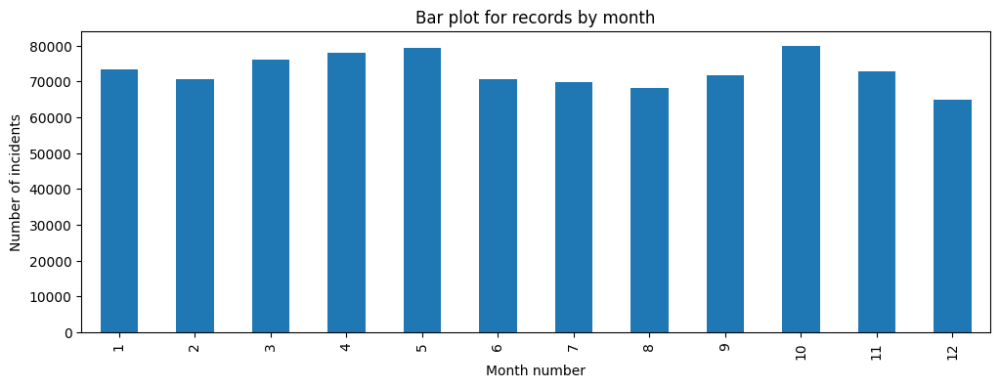

In [37]:
plt.figure(figsize=(12, 4))

months_event=df.groupby(by='month').count()
months_event.iloc[:,0].plot(kind='bar')
plt.title('Bar plot for records by month')
plt.xlabel("Month number")
plt.ylabel("Number of incidents")
plt.show()

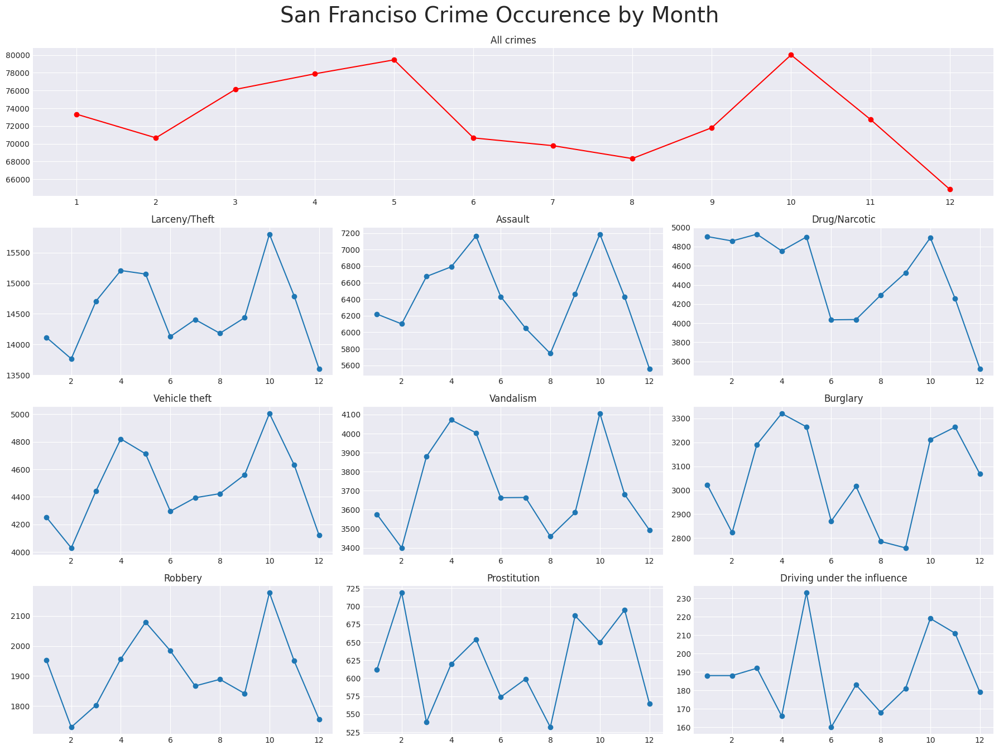

In [38]:
pylab.rcParams['figure.figsize'] = (18.0, 13.0)

larceny = df[df['Category'] == "LARCENY/THEFT"]
assault = df[df['Category'] == "ASSAULT"]
drug = df[df['Category'] == "DRUG/NARCOTIC"]
vehicle = df[df['Category'] == "VEHICLE THEFT"]
vandalism = df[df['Category'] == "VANDALISM"]
burglary = df[df['Category'] == "BURGLARY"]
robbery = df[df['Category'] == "ROBBERY"]
prostitution = df[df['Category'] == "PROSTITUTION"]
driving_drunk = df[df['Category'] == "DRIVING UNDER THE INFLUENCE"]

with plt.style.context('seaborn-darkgrid'):
    ax1 = plt.subplot2grid((4,3), (0, 0), colspan=3)
    ax1.plot(df.groupby('month').size(), 'ro-')
    ax1.set_title ('All crimes')
    ax1.xaxis.set_ticks(np.arange(1, 13, 1))
    
    ax2 = plt.subplot2grid((4,3), (1, 0))
    ax2.plot(larceny.groupby('month').size(), 'o-')
    ax2.set_title ('Larceny/Theft')
    
    ax3 = plt.subplot2grid((4,3), (1, 1))
    ax3.plot(assault.groupby('month').size(), 'o-')
    ax3.set_title ('Assault')
    
    ax4 = plt.subplot2grid((4,3), (1, 2))
    ax4.plot(drug.groupby('month').size(), 'o-')
    ax4.set_title ('Drug/Narcotic')
    
    ax5 = plt.subplot2grid((4,3), (2, 0))
    ax5.plot(vehicle.groupby('month').size(), 'o-')
    ax5.set_title ('Vehicle theft')
    
    ax6 = plt.subplot2grid((4,3), (2, 1))
    ax6.plot(vandalism.groupby('month').size(), 'o-')
    ax6.set_title ('Vandalism')
    
    ax7 = plt.subplot2grid((4,3), (2, 2))
    ax7.plot(burglary.groupby('month').size(), 'o-')
    ax7.set_title ('Burglary')

    ax8 = plt.subplot2grid((4,3), (3, 0))
    ax8.plot(robbery.groupby('month').size(), 'o-')
    ax8.set_title ('Robbery')
    
    ax9 = plt.subplot2grid((4,3), (3, 1))
    ax9.plot(prostitution.groupby('month').size(), 'o-')
    ax9.set_title ('Prostitution')
    
    ax10 = plt.subplot2grid((4,3), (3, 2))
    ax10.plot(driving_drunk.groupby('month').size(), 'o-')
    ax10.set_title ('Driving under the influence')
  
    pylab.gcf().text(0.5, 1.03, 
                    'San Franciso Crime Occurence by Month',
                     horizontalalignment='center',
                     verticalalignment='top', 
                     fontsize = 28)
    
plt.tight_layout()
plt.show()

**Crime ocurrence by year**

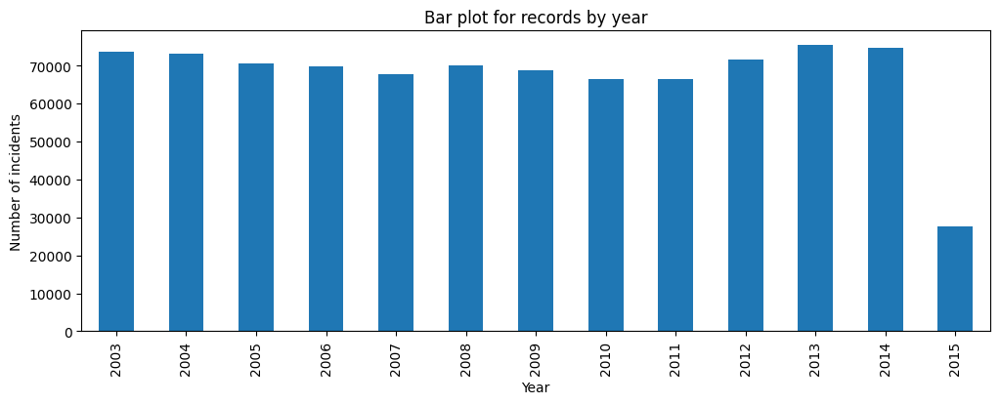

In [39]:
plt.figure(figsize=(12, 4))

years_event=df.groupby(by='year').count()
years_event.iloc[:,0].plot(kind='bar')
plt.title('Bar plot for records by year')
plt.xlabel("Year")
plt.ylabel("Number of incidents")
plt.show()

In [40]:
df2 = df.copy()
Others = df2.Category.value_counts()[10:].index.tolist()
df2.Category.replace(Others, 'OTHER OFFENSES', inplace=True)
df2.Category.unique()

array(['WARRANTS', 'OTHER OFFENSES', 'LARCENY/THEFT', 'VEHICLE THEFT',
       'VANDALISM', 'NON-CRIMINAL', 'ASSAULT', 'BURGLARY',
       'SUSPICIOUS OCC', 'DRUG/NARCOTIC'], dtype=object)

In [41]:
df_ct=pd.crosstab(df2['year'], df2['Category'], rownames=['year'], colnames=['Category'])
df_ct

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
year,,,,,,,,,,
2003,6553,2999,4873,12961,6548,22341,2102,3259,7578,4516
2004,6459,3321,4865,12093,6840,21448,2261,3173,8756,3970
2005,5768,3450,4374,12358,6918,19387,2337,3462,9099,3405
2006,6362,3536,4694,13769,6584,21541,2403,3877,3696,3251
2007,6100,2645,5212,12718,6237,22134,2387,3682,3246,3480
2008,6323,2791,5863,12758,5995,24488,2317,3568,2972,2901
2009,5965,2615,5945,12467,6162,24150,2211,3767,2599,2890
2010,6119,2482,4481,12171,6908,22001,2954,3988,2186,3064
2011,6113,2509,3371,13042,7656,21560,3048,3561,2359,3256


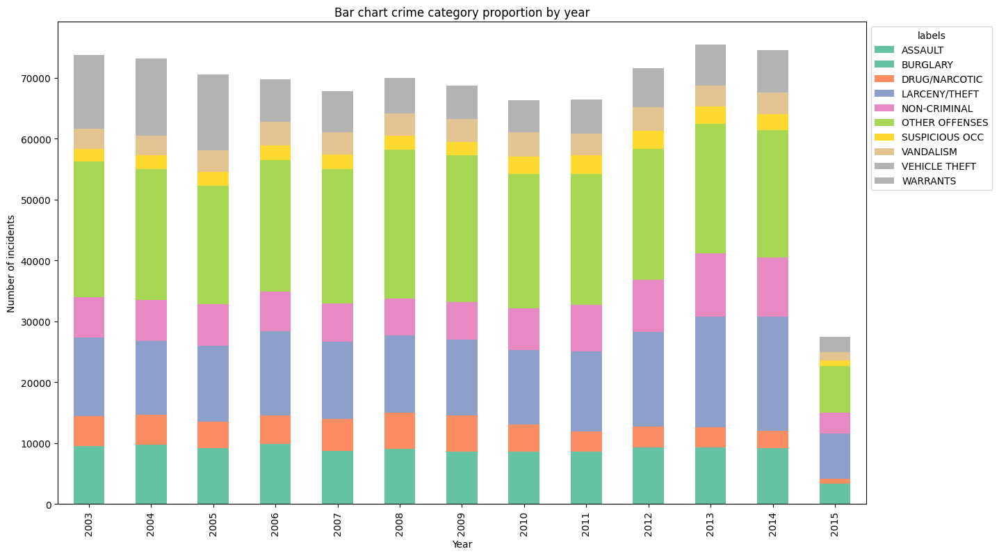

In [42]:
ax = df_ct.plot(kind='bar', stacked=True, figsize=(15, 9), colormap='Set2')
plt.legend(title='labels', bbox_to_anchor=(1.0, 1), loc='upper left')
plt.title('Bar chart crime category proportion by year')
ax.set_ylabel('Number of incidents')
ax.set_xlabel('Year')
plt.show()

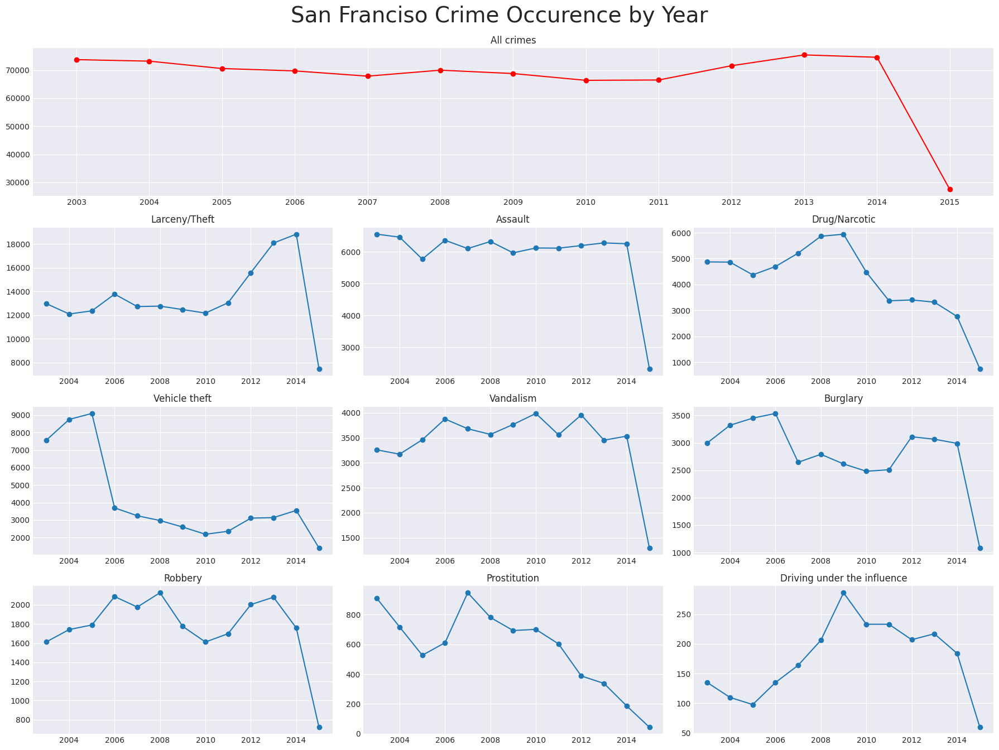

In [43]:
pylab.rcParams['figure.figsize'] = (18.0, 13.0)

larceny = df[df['Category'] == "LARCENY/THEFT"]
assault = df[df['Category'] == "ASSAULT"]
drug = df[df['Category'] == "DRUG/NARCOTIC"]
vehicle = df[df['Category'] == "VEHICLE THEFT"]
vandalism = df[df['Category'] == "VANDALISM"]
burglary = df[df['Category'] == "BURGLARY"]
robbery = df[df['Category'] == "ROBBERY"]
prostitution = df[df['Category'] == "PROSTITUTION"]
driving_drunk = df[df['Category'] == "DRIVING UNDER THE INFLUENCE"]

with plt.style.context('seaborn-darkgrid'):
    ax1 = plt.subplot2grid((4,3), (0, 0), colspan=3)
    ax1.plot(df.groupby('year').size(), 'ro-')
    ax1.set_title ('All crimes')
    ax1.xaxis.set_ticks(np.arange(2003, 2016, 1))
    
    ax2 = plt.subplot2grid((4,3), (1, 0))
    ax2.plot(larceny.groupby('year').size(), 'o-')
    ax2.set_title ('Larceny/Theft')
    
    ax3 = plt.subplot2grid((4,3), (1, 1))
    ax3.plot(assault.groupby('year').size(), 'o-')
    ax3.set_title ('Assault')
    
    ax4 = plt.subplot2grid((4,3), (1, 2))
    ax4.plot(drug.groupby('year').size(), 'o-')
    ax4.set_title ('Drug/Narcotic')
    
    ax5 = plt.subplot2grid((4,3), (2, 0))
    ax5.plot(vehicle.groupby('year').size(), 'o-')
    ax5.set_title ('Vehicle theft')
    
    ax6 = plt.subplot2grid((4,3), (2, 1))
    ax6.plot(vandalism.groupby('year').size(), 'o-')
    ax6.set_title ('Vandalism')
    
    ax7 = plt.subplot2grid((4,3), (2, 2))
    ax7.plot(burglary.groupby('year').size(), 'o-')
    ax7.set_title ('Burglary')

    ax8 = plt.subplot2grid((4,3), (3, 0))
    ax8.plot(robbery.groupby('year').size(), 'o-')
    ax8.set_title ('Robbery')
    
    ax9 = plt.subplot2grid((4,3), (3, 1))
    ax9.plot(prostitution.groupby('year').size(), 'o-')
    ax9.set_title ('Prostitution')
    
    ax10 = plt.subplot2grid((4,3), (3, 2))
    ax10.plot(driving_drunk.groupby('year').size(), 'o-')
    ax10.set_title ('Driving under the influence')
  
    pylab.gcf().text(0.5, 1.03, 
                    'San Franciso Crime Occurence by Year',
                     horizontalalignment='center',
                     verticalalignment='top', 
                     fontsize = 28)
    
plt.tight_layout()
plt.show()

### N-gram analysis of Address column

In this step we will do an interesting analysis of most frequent words, bigrams and trigrams in the address columns, this is to find patterns or common streets that could help us enhance the meaning of our data. If you want to see more details about the process and functions you are about to see I kindly encourage you to see the following notebooks in which I explain it much better:

https://www.kaggle.com/georgesaavedra/text-news-topic-classification

https://www.kaggle.com/georgesaavedra/best-nlp-disaster-tweets-classifier


In [44]:
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /home/u213931/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     /home/u213931/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /home/u213931/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /home/u213931/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /home/u213931/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to
[nltk_data]

True

Will create a copy in case the data ends unsorted or wasted.

In [45]:
df3 = df.copy()

**Removing punctuations:**


In [46]:
import string

def remove_punct(text):
    table=str.maketrans('','', string.punctuation)
    return text.translate(table)

example="I am a #king"
print(remove_punct(example))

I am a king


In [47]:
df3['Address']=df3['Address'].apply(lambda x : remove_punct(x))

**Removing numbers:**


In [48]:
df3['Address']=df3['Address'].str.replace('\d+', '')

In [49]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/u213931/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [50]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

Text(0.5, 1.0, '15 most common words in Address column')

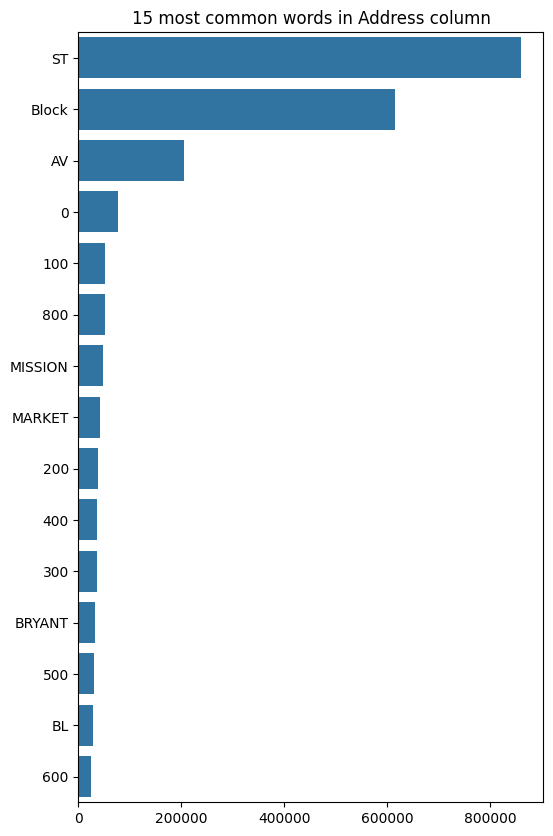

In [51]:
from collections import defaultdict,Counter

word_count = Counter(" ".join(df3['Address']).split()).most_common(100)
x=[]
y=[]
for word,count in word_count:
    if (word.casefold() not in stop_words) :
        x.append(word)
        y.append(count)

plt.figure(figsize=(6, 10))
sns.barplot(x=y[:15],y=x[:15])
plt.title('15 most common words in Address column')

Now let's compute the N-grams in each set already mentioned, the folowing function generate_ngrams will help us with the process:

In [52]:
# Define ngram generator function
def generate_ngrams(text, n_gram):
    token = [token for token in text.lower().split(' ') if token != '' if token not in stop_words]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

The number of N-grams to compute:

In [53]:
N=30

We will display the top 30 bigrams for the cleaned and uncleaned address column, in other words, we will see if the numbers, punctuations are key when finding a common street:

In [54]:
# Bigrams
training_bigrams = defaultdict(int)
training_bigrams2 = defaultdict(int)

for instance in df3['Address']:
    for word in generate_ngrams(instance, n_gram=2):
        training_bigrams[word] += 1

for instance in df['Address']:
    for word in generate_ngrams(instance, n_gram=2):
        training_bigrams2[word] += 1
   
df_training_bigrams = pd.DataFrame(sorted(training_bigrams.items(), key=lambda x: x[1])[::-1])
df_training_bigrams2 = pd.DataFrame(sorted(training_bigrams2.items(), key=lambda x: x[1])[::-1])

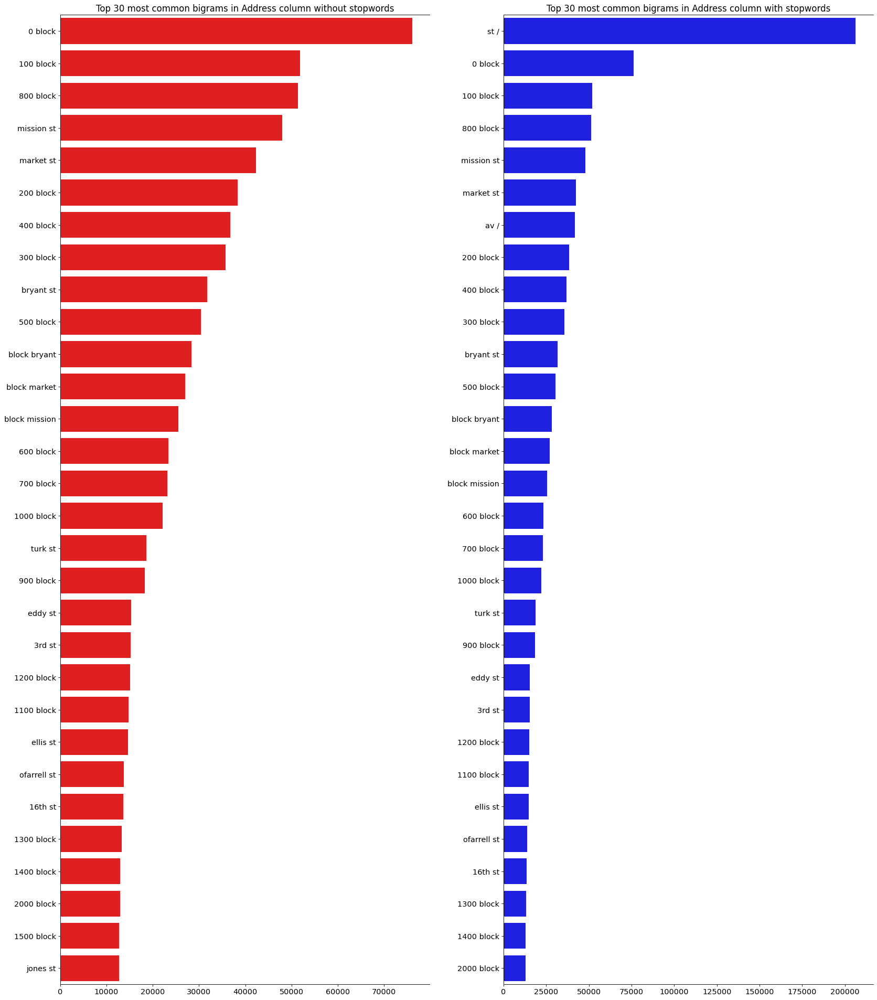

<Figure size 1800x1300 with 0 Axes>

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,30), dpi=80)
#plt.tight_layout()

sns.barplot(y=df_training_bigrams[0].values[:N], x=df_training_bigrams[1].values[:N], ax=ax1, color='r')
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)

sns.barplot(y=df_training_bigrams2[0].values[:N], x=df_training_bigrams2[1].values[:N], ax=ax2, color='b')
ax2.spines['right'].set_visible(False)
ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)

ax1.set_title(f'Top {N} most common bigrams in Address column without stopwords', fontsize=15)
ax2.set_title(f'Top {N} most common bigrams in Address column with stopwords', fontsize=15)

plt.show()
plt.tight_layout()

We will do exactly the same process but for trigrams in both cleaned and uncleaned addresses:

In [56]:
# Trigrams
training_trigrams = defaultdict(int)
training_trigrams2 = defaultdict(int)

for instance in df3['Address']:
    for word in generate_ngrams(instance, n_gram=3):
        training_trigrams[word] += 1

for instance in df['Address']:
    for word in generate_ngrams(instance, n_gram=3):
        training_trigrams2[word] += 1
   
df_training_trigrams = pd.DataFrame(sorted(training_trigrams.items(), key=lambda x: x[1])[::-1])
df_training_trigrams2 = pd.DataFrame(sorted(training_trigrams2.items(), key=lambda x: x[1])[::-1])

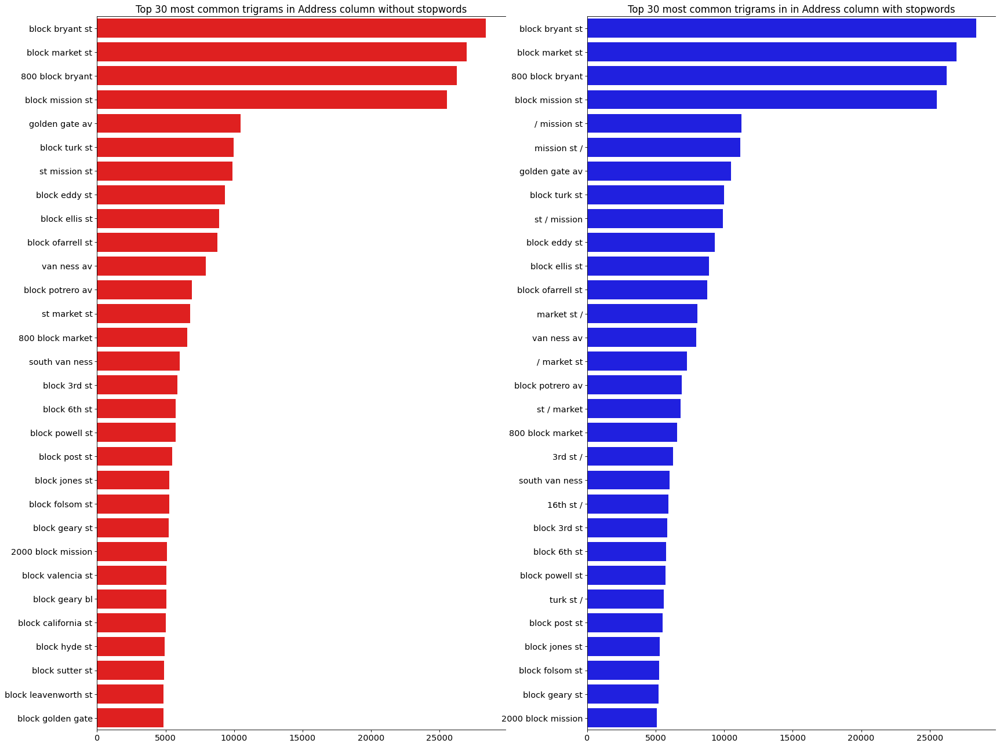

<Figure size 1800x1300 with 0 Axes>

In [57]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,20), dpi=80)
#plt.tight_layout()

sns.barplot(y=df_training_trigrams[0].values[:N], x=df_training_trigrams[1].values[:N], ax=ax1, color='r')
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)

sns.barplot(y=df_training_trigrams2[0].values[:N], x=df_training_trigrams2[1].values[:N], ax=ax2, color='b')
ax2.spines['right'].set_visible(False)
ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)

ax1.set_title(f'Top {N} most common trigrams in Address column without stopwords', fontsize=15)
ax2.set_title(f'Top {N} most common trigrams in in Address column with stopwords', fontsize=15)

plt.show()
plt.tight_layout()

Let's bring back the top 15 most frequent words obtained at the beginning of the N-gram analysis, notice there are some that are super common such as: St or Block, these can help but I really prefer using the 15 and the method is similar to one hot encoding function, if the address contains the "key word" then place a 1 in the "column key word".

In [58]:
key_addresses = x[:15]
key_addresses

['ST',
 'Block',
 'AV',
 '0',
 '100',
 '800',
 'MISSION',
 'MARKET',
 '200',
 '400',
 '300',
 'BRYANT',
 '500',
 'BL',
 '600']

In [59]:
df.sample(3)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,year,month,day,hour
2990,2015-04-29 10:19:00,SECONDARY CODES,DOMESTIC VIOLENCE,Wednesday,NORTHERN,NONE,2800 Block of BAKER ST,-122.445577,37.797001,2015,4,29,10
20807,2015-02-04 00:47:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Wednesday,RICHMOND,"ARREST, BOOKED",FULTON ST / PARKPRESIDIO BL,-122.471762,37.773137,2015,2,4,0
830596,2003-08-21 12:00:00,LARCENY/THEFT,PETTY THEFT FROM A BUILDING,Thursday,MISSION,NONE,2900 Block of 19TH ST,-122.411336,37.760350,2003,8,21,12


Time now to narrow down the features that we will use in feature engineering process, as I said earlier the Resolution and Descript are not important and the Dates can be deleted.

## Feature Engineering

In [60]:
df4 = df[['Category','DayOfWeek','PdDistrict','Address','X','Y','year','month','day','hour']]
df4.sample(3)

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,day,hour
58418,OTHER OFFENSES,Wednesday,NORTHERN,GOLDEN GATE AV / FRANKLIN ST,-122.422090,37.780822,2014,8,6,22
538352,DRUG/NARCOTIC,Saturday,CENTRAL,BROADWAY ST / MONTGOMERY ST,-122.403865,37.798223,2007,10,6,0
872007,WEAPON LAWS,Monday,NORTHERN,0 Block of CEDAR ST,-122.419017,37.786517,2003,2,3,15


Firstly, despite the fact that we will use a Tree-based algorithm to classify the instances we will scale all our features in order to have all of them more meaningful and easier to understand/follow.

For this we have to min-max scale the longitude and latitude coordinates so as to have them numbers between 0 to 1:

In [61]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()

In [62]:
df4.loc[:,['X','Y']] = mm.fit_transform(df4.loc[:,['X','Y']])

We will one-hot-encode the date components as they make more sense as nominal categorical variables rather than ordinal variables, this is because we don't see a linear relation of crimes with the hour or months, it does not have a linear relation, all crime types have a specific non-linear behaviour with time components, this is why setting them as one hot columns will obtain patterns about the most frequent hour for a certain crime (prostitution), the month with more thefts (robbery) or the day with more drug-dealing or driver with alcohol influence incidents.

In [63]:
nominal_variables = ['year','month','day','hour','DayOfWeek','PdDistrict']
df4 = pd.get_dummies(df4, columns = nominal_variables, drop_first=True) 

And finally the reason why we performed N-gram analysis, in the following cells we will associate columns to key words contained in the address:

In [64]:
key_addresses

['ST',
 'Block',
 'AV',
 '0',
 '100',
 '800',
 'MISSION',
 'MARKET',
 '200',
 '400',
 '300',
 'BRYANT',
 '500',
 'BL',
 '600']

In [65]:
df4['Block'] = df4['Address'].str.contains('block|bl', case=False)
df4['AV'] = df4['Address'].str.contains('av', case=False)
df4['Mission'] = df4['Address'].str.contains('mission', case=False)
df4['Market'] = df4['Address'].str.contains('market', case=False)
df4['Bryant'] = df4['Address'].str.contains('bryant', case=False)
df4['RD'] = df4['Address'].str.contains('rd', case=False)
df4['Geary'] = df4['Address'].str.contains('geary', case=False)
df4['Turk'] = df4['Address'].str.contains('turk', case=False)
df4['Eddy'] = df4['Address'].str.contains('eddy', case=False)
df4['DR'] = df4['Address'].str.contains('dr', case=False)
df4['Ellis'] = df4['Address'].str.contains('ellis', case=False)
df4['Ofarrell'] = df4['Address'].str.contains('ofarrell', case=False)

In [66]:
df4[['Block','AV','Mission','Market','Bryant','RD','Geary','Turk','Eddy','DR','Ellis','Ofarrell']] = df4[['Block','AV','Mission','Market','Bryant','RD','Geary','Turk','Eddy','DR','Ellis','Ofarrell']].astype(int)

In [67]:
df4.drop(columns=['Address'], inplace=True)

At this moment the data should contain 106 columns considering features and label:

In [68]:
df4.sample(3)

,Category,X,Y,year_2004,year_2005,year_2006,year_2007,year_2008,year_2009,year_2010,...,Mission,Market,Bryant,RD,Geary,Turk,Eddy,DR,Ellis,Ofarrell
460854,PROSTITUTION,0.647657,0.496830,False,False,False,False,True,False,False,...,0,0,0,0,0,0,0,0,0,0
205355,ASSAULT,0.955026,0.186426,False,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
710840,VEHICLE THEFT,0.303889,0.500119,False,True,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0


As a result we should have a dataset with all features containing values between 0 to 1:

In [69]:
df4.describe().T

,count,mean,std,min,25%,50%,75%,max
X,875659.0,0.611090,0.170010,0.0,0.542623,0.653618,0.717418,1.0
Y,875659.0,0.527734,0.215578,0.0,0.397411,0.602532,0.682456,1.0
Block,875659.0,0.717206,0.450357,0.0,0.000000,1.000000,1.000000,1.0
AV,875659.0,0.249520,0.432735,0.0,0.000000,0.000000,0.000000,1.0
Mission,875659.0,0.054875,0.227737,0.0,0.000000,0.000000,0.000000,1.0
Market,875659.0,0.048344,0.214493,0.0,0.000000,0.000000,0.000000,1.0
Bryant,875659.0,0.036282,0.186992,0.0,0.000000,0.000000,0.000000,1.0
RD,875659.0,0.049187,0.216258,0.0,0.000000,0.000000,0.000000,1.0
Geary,875659.0,0.022948,0.149739,0.0,0.000000,0.000000,0.000000,1.0
Turk,875659.0,0.021290,0.144350,0.0,0.000000,0.000000,0.000000,1.0


We can confirm that all our variables have maximum and minimum 1.0 and 0.0 respectively by counting their max() and min() as follows:

In [70]:
df4.drop(columns=['Category']).max().value_counts()

1.0    105
Name: count, dtype: int64

In [71]:
df4.drop(columns=['Category']).min().value_counts()

0.0    105
Name: count, dtype: int64

## Modeling

As first step we have to create the features (105 columns) and label (Category column) sets:

In [72]:
features = df4.drop(columns=['Category'])
label = df4['Category']

In [73]:
features.shape, label.shape

((875659, 105), (875659,))

Another important aspect about our data is the extreme unbalance in the label, as the most frequent crime LARCENY/THEFT occured 174305 times and the least frequent TREA has only 6 records, this is crucial as if we don't consider a balancing techinque doesn't matter what powerful algorithm we use the prediction will be biased towards the most frequent class making our model unuseful. There are well known balancing techniques used in ML being SMOTE the most used and preferred one, however the possible techniques are undersampling in which reduces all instances to the least frequent class (which is hardly ever useful) or oversampling which increases all instances to the most frequent class, but this has a big disadvantage, it's proper to use when the difference in instances is under a threshold and for our current dataset there is an extremely significant difference, this creates a big problem and the most proper solution would be to reduce the amount of categories to 15 or 20 maximum by grouping the least frequent into one category, reducing such gap in number of incidents, once we have that we could apply SMOTE technique and expect a high performance by our model, this is a pending step as the submission considers the probability that the instance corresponds to one of the 39 categories. 

In [74]:
label.value_counts()

Category
LARCENY/THEFT                  174305
OTHER OFFENSES                 125943
NON-CRIMINAL                    91911
ASSAULT                         76811
DRUG/NARCOTIC                   53919
VEHICLE THEFT                   53697
VANDALISM                       44580
WARRANTS                        42137
BURGLARY                        36599
SUSPICIOUS OCC                  31392
MISSING PERSON                  25669
ROBBERY                         22987
FRAUD                           16637
FORGERY/COUNTERFEITING          10592
SECONDARY CODES                  9979
WEAPON LAWS                      8550
PROSTITUTION                     7446
TRESPASS                         7317
STOLEN PROPERTY                  4536
SEX OFFENSES FORCIBLE            4379
DISORDERLY CONDUCT               4311
DRUNKENNESS                      4277
RECOVERED VEHICLE                3132
KIDNAPPING                       2340
DRIVING UNDER THE INFLUENCE      2268
LIQUOR LAWS                      1899
RUN

In [75]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(features, label)

In [76]:
X_res.shape

(6797895, 105)

In [77]:
y_res.value_counts()

Category
WARRANTS                       174305
EMBEZZLEMENT                   174305
SEX OFFENSES FORCIBLE          174305
PROSTITUTION                   174305
DISORDERLY CONDUCT             174305
ARSON                          174305
FAMILY OFFENSES                174305
LIQUOR LAWS                    174305
BRIBERY                        174305
SUICIDE                        174305
RUNAWAY                        174305
LOITERING                      174305
SEX OFFENSES NON FORCIBLE      174305
EXTORTION                      174305
GAMBLING                       174305
BAD CHECKS                     174305
TREA                           174305
RECOVERED VEHICLE              174305
DRIVING UNDER THE INFLUENCE    174305
KIDNAPPING                     174305
OTHER OFFENSES                 174305
BURGLARY                       174305
LARCENY/THEFT                  174305
VEHICLE THEFT                  174305
VANDALISM                      174305
NON-CRIMINAL                   174305
ROB

In [78]:
from sklearn.model_selection import train_test_split

In [79]:
X_train, X_val, label_train, label_val = train_test_split(X_res, y_res, test_size=0.10, random_state=42)

In [80]:
X_train.shape, X_val.shape, label_train.shape, label_val.shape

((6118105, 105), (679790, 105), (6118105,), (679790,))

In [81]:
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import label_binarize

In [82]:
pip install catboost

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


**Model training:**

In [83]:
from catboost import CatBoostClassifier

cat_model_class = CatBoostClassifier(iterations=50,
                                     learning_rate=0.7,
                                     random_seed=42,
                                     depth=3)

cat_model_class.fit(X_train, label_train, 
                    cat_features=None, 
                    eval_set=(X_val, label_val), 
                    verbose=False)

TBB Warning: The number of workers is currently limited to 11. The request for 23 workers is ignored. Further requests for more workers will be silently ignored until the limit changes.



In [84]:
label_pred_cat=cat_model_class.predict(X_val)
print(classification_report(label_val,label_pred_cat))

                             precision    recall  f1-score   support

                      ARSON       0.12      0.10      0.11     17445
                    ASSAULT       0.04      0.00      0.00     17212
                 BAD CHECKS       0.12      0.19      0.15     17434
                    BRIBERY       0.11      0.16      0.13     17492
                   BURGLARY       0.07      0.09      0.08     17305
         DISORDERLY CONDUCT       0.17      0.16      0.16     17125
DRIVING UNDER THE INFLUENCE       0.16      0.33      0.22     17470
              DRUG/NARCOTIC       0.14      0.33      0.19     17784
                DRUNKENNESS       0.11      0.05      0.07     17700
               EMBEZZLEMENT       0.10      0.12      0.11     17402
                  EXTORTION       0.09      0.16      0.11     17404
            FAMILY OFFENSES       0.12      0.23      0.15     17335
     FORGERY/COUNTERFEITING       0.08      0.06      0.07     17170
                      FRAUD      

In order to properly predict the categories of the testing set with the ML model we have to apply the same processing steps we performed so as to have the same features and distributions:

In [85]:
def test_file_processing(df_t):
  df_t['Dates'] =  pd.to_datetime(df_t['Dates'], infer_datetime_format=True)
  df_t['year'] = pd.to_datetime(df_t['Dates']).dt.year
  df_t['month'] = pd.to_datetime(df_t['Dates']).dt.month
  df_t['day'] = pd.to_datetime(df_t['Dates']).dt.day
  df_t['hour'] = pd.to_datetime(df_t['Dates']).dt.hour
  nominal_variables = ['year',	'month',	'day',	'hour', 'DayOfWeek', 'PdDistrict']
  df_t = pd.get_dummies(df_t, columns = nominal_variables, drop_first=True) 
  df_t['Block'] = df_t['Address'].str.contains('block|bl', case=False)
  df_t['AV'] = df_t['Address'].str.contains('av', case=False)
  df_t['Mission'] = df_t['Address'].str.contains('mission', case=False)
  df_t['Market'] = df_t['Address'].str.contains('market', case=False)
  df_t['Bryant'] = df_t['Address'].str.contains('bryant', case=False)
  df_t['RD'] = df_t['Address'].str.contains('rd', case=False)
  df_t['Geary'] = df_t['Address'].str.contains('geary', case=False)
  df_t['Turk'] = df_t['Address'].str.contains('turk', case=False)
  df_t['Eddy'] = df_t['Address'].str.contains('eddy', case=False)
  df_t['DR'] = df_t['Address'].str.contains('dr', case=False)
  df_t['Ellis'] = df_t['Address'].str.contains('ellis', case=False)
  df_t['Ofarrell'] = df_t['Address'].str.contains('ofarrell', case=False)
  df_t.drop(columns=['Dates','Address','Id'], inplace=True)
  df_t[['Block','AV','Mission','Market','Bryant','RD','Geary','Turk','Eddy','DR','Ellis','Ofarrell']] = df_t[['Block','AV','Mission','Market','Bryant','RD','Geary','Turk','Eddy','DR','Ellis','Ofarrell']].astype(int)

  return df_t

In [86]:
test_file_processed = test_file_processing(df_test)

/home/u213931/tmp/ipykernel_3239276/3458422882.py:2: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_t['Dates'] =  pd.to_datetime(df_t['Dates'], infer_datetime_format=True)


In [87]:
test_file_processed.shape

(884262, 105)

In [88]:
label_test_pred_prob = cat_model_class.predict_proba(test_file_processed)

In [89]:
label_test_pred_class = cat_model_class.predict(test_file_processed)

The following line should print the class predicted for instances in testing file:

In [90]:
label_test_pred_class

array([['LARCENY/THEFT'],
       ['PROSTITUTION'],
       ['LARCENY/THEFT'],
       ...,
       ['BURGLARY'],
       ['BURGLARY'],
       ['BURGLARY']], dtype=object)

I would like to know any feedback in order to improve the analysis and obviously in the building of the model or tell me if you found a different method which gave you an outstanding performance!

If you liked this notebook I would appreciate so much your upvote if you want to see more projects/tutorials like this one. I encourage you to see my projects portfolio, am sure you will love it.

Thank you!

In [91]:
pip install nltk

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [92]:
pip install imblearn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


## Colourmap

In [93]:
pip install geopandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [94]:
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
import branca.colormap as cm
import datetime as dt

In [95]:
pip install folium

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [96]:
data = pd.read_csv("train.csv")

In [97]:
data["Dates"] = pd.to_datetime(data["Dates"])
data["Year"] = data["Dates"].dt.year
data["Month"] = data["Dates"].dt.month
data["Day"] = data["Dates"].dt.day

In [98]:
data.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Month,Day
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13


In [99]:
map_test = data.copy()
map_test = map_test.groupby(by=["PdDistrict"]).agg("count")
map_test["Crimes"] = map_test["Category"]
map_test.reset_index(inplace=True)
map_test

,PdDistrict,Dates,Category,Descript,DayOfWeek,Resolution,Address,X,Y,Year,Month,Day,Crimes
0,BAYVIEW,89431,89431,89431,89431,89431,89431,89431,89431,89431,89431,89431,89431
1,CENTRAL,85460,85460,85460,85460,85460,85460,85460,85460,85460,85460,85460,85460
2,INGLESIDE,78845,78845,78845,78845,78845,78845,78845,78845,78845,78845,78845,78845
3,MISSION,119908,119908,119908,119908,119908,119908,119908,119908,119908,119908,119908,119908
4,NORTHERN,105296,105296,105296,105296,105296,105296,105296,105296,105296,105296,105296,105296
5,PARK,49313,49313,49313,49313,49313,49313,49313,49313,49313,49313,49313,49313
6,RICHMOND,45209,45209,45209,45209,45209,45209,45209,45209,45209,45209,45209,45209
7,SOUTHERN,157182,157182,157182,157182,157182,157182,157182,157182,157182,157182,157182,157182
8,TARAVAL,65596,65596,65596,65596,65596,65596,65596,65596,65596,65596,65596,65596
9,TENDERLOIN,81809,81809,81809,81809,81809,81809,81809,81809,81809,81809,81809,81809


In [100]:
sfpd = gpd.read_file("current_police_districts.geojson")
     

In [101]:
sfpd=sfpd[["district","geometry"]]
sfpd.columns=["PdDistrict", "geometry"]
sfpd.head()

,PdDistrict,geometry
0,SOUTHERN,"MULTIPOLYGON (((-122.39186 37.79425, -122.3917..."
1,BAYVIEW,"MULTIPOLYGON (((-122.38098 37.76480, -122.3810..."
2,MISSION,"MULTIPOLYGON (((-122.40954 37.76932, -122.4086..."
3,NORTHERN,"MULTIPOLYGON (((-122.43379 37.80793, -122.4337..."
4,TENDERLOIN,"MULTIPOLYGON (((-122.40217 37.78626, -122.4171..."


In [102]:
map_test_all = sfpd.merge(map_test,on="PdDistrict")

In [103]:
map_test_all

,PdDistrict,geometry,Dates,Category,Descript,DayOfWeek,Resolution,Address,X,Y,Year,Month,Day,Crimes
0,SOUTHERN,"MULTIPOLYGON (((-122.39186 37.79425, -122.3917...",157182,157182,157182,157182,157182,157182,157182,157182,157182,157182,157182,157182
1,BAYVIEW,"MULTIPOLYGON (((-122.38098 37.76480, -122.3810...",89431,89431,89431,89431,89431,89431,89431,89431,89431,89431,89431,89431
2,MISSION,"MULTIPOLYGON (((-122.40954 37.76932, -122.4086...",119908,119908,119908,119908,119908,119908,119908,119908,119908,119908,119908,119908
3,NORTHERN,"MULTIPOLYGON (((-122.43379 37.80793, -122.4337...",105296,105296,105296,105296,105296,105296,105296,105296,105296,105296,105296,105296
4,TENDERLOIN,"MULTIPOLYGON (((-122.40217 37.78626, -122.4171...",81809,81809,81809,81809,81809,81809,81809,81809,81809,81809,81809,81809
5,CENTRAL,"MULTIPOLYGON (((-122.42612 37.80684, -122.4261...",85460,85460,85460,85460,85460,85460,85460,85460,85460,85460,85460,85460
6,PARK,"MULTIPOLYGON (((-122.43956 37.78314, -122.4383...",49313,49313,49313,49313,49313,49313,49313,49313,49313,49313,49313,49313
7,RICHMOND,"MULTIPOLYGON (((-122.44127 37.79149, -122.4406...",45209,45209,45209,45209,45209,45209,45209,45209,45209,45209,45209,45209
8,INGLESIDE,"MULTIPOLYGON (((-122.40450 37.74858, -122.4040...",78845,78845,78845,78845,78845,78845,78845,78845,78845,78845,78845,78845
9,TARAVAL,"MULTIPOLYGON (((-122.49842 37.70810, -122.4984...",65596,65596,65596,65596,65596,65596,65596,65596,65596,65596,65596,65596


In [104]:
colormap = cm.linear.YlGnBu_09.to_step(data=map_test_all["Crimes"], method="quant", quantiles=[0,0.25,0.5,0.75, 1])
colormap

In [105]:
center = [37.76400322033825, -122.439603744809]
colormap.caption = "# of Crimes"
sfmap = folium.Map(location=center, zoom_start=12,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(sfmap)
style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x["properties"]["Crimes"]), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
info=folium.features.GeoJson(
        map_test_all,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=["PdDistrict","Crimes"],
            aliases=["Police Department District: ","# of Crimes"],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )
colormap.add_to(sfmap)
sfmap.add_child(info)
sfmap

In [106]:
sfmap.save("cumulative.html")

## Logistic Regression

In [107]:
# load all the needed packages
import plotly
import numpy as np
import pandas as pd
import geopandas as gpd
from plotly import tools
import chart_studio.plotly as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.metrics import log_loss
from sklearn.naive_bayes import BernoulliNB
from sklearn.preprocessing import LabelEncoder
from shapely.geometry import Point, Polygon, shape
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import chart_studio.tools as tls
tls.set_credentials_file(username='skjbkz', api_key='DzaZwUxqb5w49gviuayH')

In [108]:
pip install plotly==5.20.0

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [109]:
pip install chart-studio

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [110]:
# load dataset and parsing the dates column into datetime then join with the geodataframe later
train = pd.read_csv('train.csv', parse_dates = ['Dates'])
test = pd.read_csv('test.csv', parse_dates = ['Dates'])
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [111]:
# slice the Dates information into hours, days, months and years
train['Dates'] = pd.to_datetime(train['Dates'], format = "%m/%d/%Y %H:%M")
train['Hour'] = train['Dates'].dt.hour
train['Day'] = train['Dates'].dt.day
train['Month'] = train['Dates'].dt.month
train['Year'] = train['Dates'].dt.year
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Hour,Day,Month,Year
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,13,5,2015
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,13,5,2015
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,23,13,5,2015
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,23,13,5,2015
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,23,13,5,2015


In [112]:
# load neighbourhoods shapefile
nbhd_map = gpd.read_file('neighbourhoods/geo_export_b536bb6f-0837-4090-a495-c4d3c63feabe.shp')

In [113]:
# convert train to a geoDataFrame
train['Coords'] = train[['X', 'Y']].apply(tuple, axis = 1).apply(Point)
train = gpd.GeoDataFrame(train, geometry = 'Coords')
train.head()


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Hour,Day,Month,Year,Coords
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,13,5,2015,POINT (-122.42589 37.77460)
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,13,5,2015,POINT (-122.42589 37.77460)
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,23,13,5,2015,POINT (-122.42436 37.80041)
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,23,13,5,2015,POINT (-122.42700 37.80087)
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,23,13,5,2015,POINT (-122.43874 37.77154)


In [114]:
# map projections
train.crs = nbhd_map.crs

In [115]:
# merge the csv dataframes with the geodataframe
train = gpd.sjoin(nbhd_map, train)

In [116]:
# count the total number of incidents in a neighbourhood
total_incidents = train.nhood.value_counts()

In [117]:
# create a new column to include
nbhd_map = nbhd_map.merge(total_incidents.to_frame('total_incidents'), left_on = 'nhood', right_index = True)
nbhd_map.head()

,nhood,geometry,total_incidents
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",61292
1,Bernal Heights,"POLYGON ((-122.40361 37.74934, -122.40378 37.7...",18887
2,Castro/Upper Market,"POLYGON ((-122.42656 37.76948, -122.42695 37.7...",23819
3,Chinatown,"POLYGON ((-122.40623 37.79756, -122.40551 37.7...",13533
4,Excelsior,"POLYGON ((-122.42398 37.73155, -122.42392 37.7...",17431


In [118]:
# use the neighbourhoods abbreviations for easier reading
abbreviations = ['Bayview', 'Brnl', 'Castro', 'ChTwn', 'Exclsr', 'FinDist', 'GlenPark', 'InRich', 'ggPark', 'Haight', 'Hayes', 'In_Sun', 'JpTwn', 'McLrn', 'TndrLn', 'LakeSh', 'Lncln', 'USF', 'Marina', 'Rus_Hill', 'Mission', 'MisBay', 'Nob', 'SeaClf', 'Noe', 'N_Beach', 'Inglsde', 'SoMA', 'Sunset/Parkside', 'Out_Mis', 'Out_Rich', 'Pcfc_Hts', 'Prtl', 'Potrero Hill', 'Presidio', 'Prsd_Hts', 'T_Isl', 'TwinPks', 'V_Val', 'WoTP', 'W_Add']
nbhd_map['abbr'] = abbreviations
nbhd_map.head()

,nhood,geometry,total_incidents,abbr
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",61292,Bayview
1,Bernal Heights,"POLYGON ((-122.40361 37.74934, -122.40378 37.7...",18887,Brnl
2,Castro/Upper Market,"POLYGON ((-122.42656 37.76948, -122.42695 37.7...",23819,Castro
3,Chinatown,"POLYGON ((-122.40623 37.79756, -122.40551 37.7...",13533,ChTwn
4,Excelsior,"POLYGON ((-122.42398 37.73155, -122.42392 37.7...",17431,Exclsr


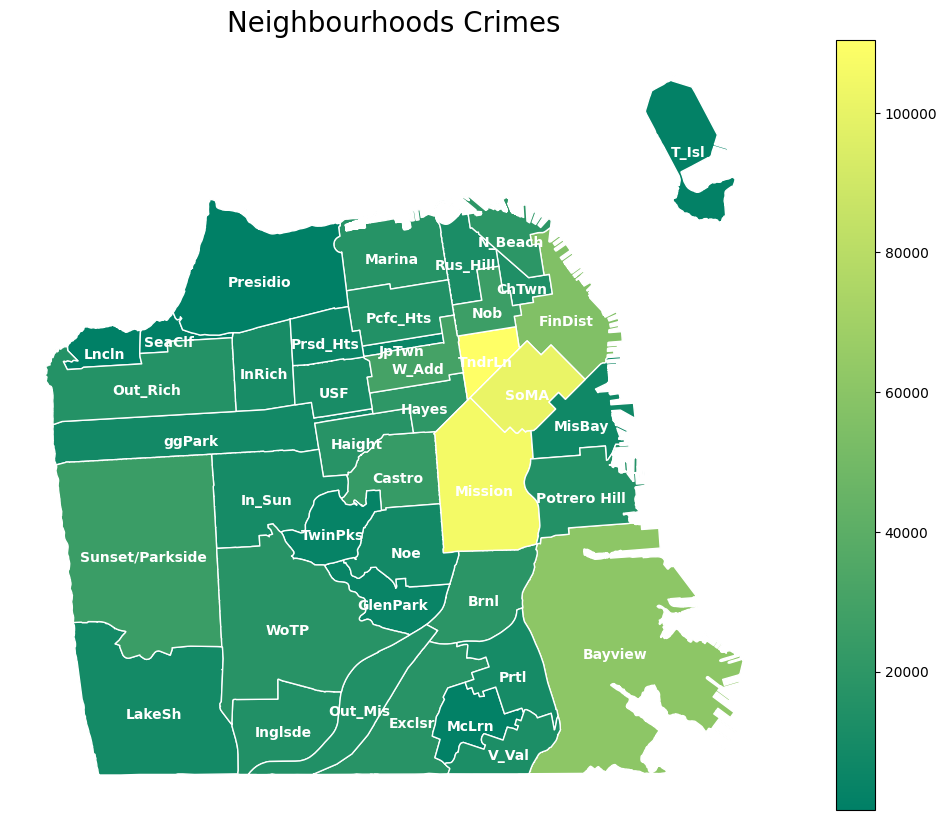

In [119]:
# create a map and colour it according to the total number of incidents
ax = nbhd_map.plot(column = 'total_incidents', cmap = 'summer', figsize = (15, 10), legend = True, linewidth = 1, edgecolor = 'white')
# remove the axis as maps look better without it
ax.axis('off')
# add a title
ax.set_title('Neighbourhoods Crimes', fontsize = 20, color = 'black')
# # label the neighbourhoods
for i in nbhd_map.index:
    coords = nbhd_map.geometry[i].centroid.coords[0]
    ax.annotate(text=nbhd_map['abbr'][i], xy=coords, xytext=coords, horizontalalignment='center', verticalalignment='top', color='white', fontweight='heavy')

plt.savefig('neighbourhood_crimes.png', transparent = True)

In [120]:
# load police districts shapefile
police_dist_map = gpd.read_file('districts/geo_export_6015689b-ee79-4cf7-acfb-097881aaf1e7.shp')

In [121]:
# set district as index column
police_dist_geom = police_dist_map.set_index('district')

In [122]:
# count the number of incidents per police district
pd_incidents = train['PdDistrict'].value_counts()

In [123]:
# create a new column to include
police_dist_geom = police_dist_geom.merge(pd_incidents.to_frame('Incidents'), left_index = True, right_index = True)

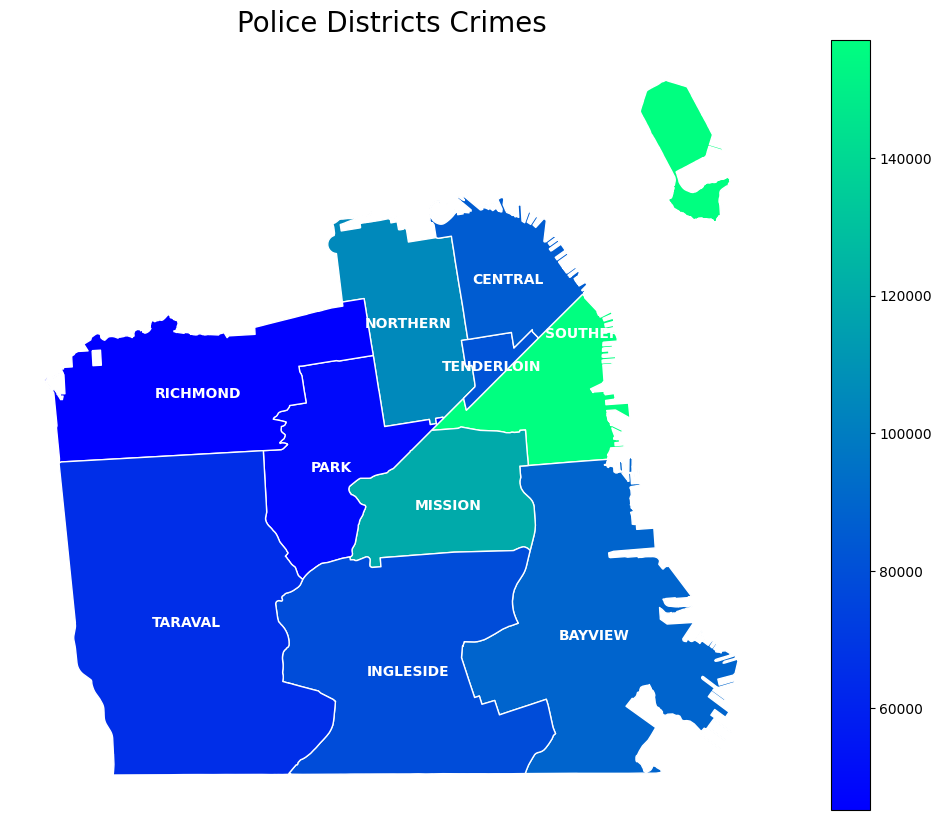

In [124]:
# create a map
ax2 = police_dist_geom.plot(column = 'Incidents', cmap = 'winter', figsize = (15,10), legend = True, linewidth = 1, edgecolor = 'white')
# customise the map
ax2.axis('off')
ax2.set_title('Police Districts Crimes', fontsize = 20, color = 'black')
for i in police_dist_geom.index:
    coords = police_dist_geom.geometry[i].centroid.coords[0]
    ax2.annotate(text = i, xy = coords, horizontalalignment = 'center', verticalalignment = 'top', color = 'white', fontweight = 'heavy')

plt.savefig('police_districts_crimes.png', transparent = True)

In [125]:
# extract all rows of street robberies using str.contains
street_robs = train[(train['Category'] == 'ROBBERY') & (train['Descript'].str.contains('STREET'))]

In [126]:
# count the total numbers of street robberies per neighbourhood
nbhd_st_rob_incdts = street_robs.nhood.value_counts()
# create a new column to include
nbhd_map = nbhd_map.merge(nbhd_st_rob_incdts.to_frame('st_rob_incdts'), left_on = 'nhood', right_index = True)

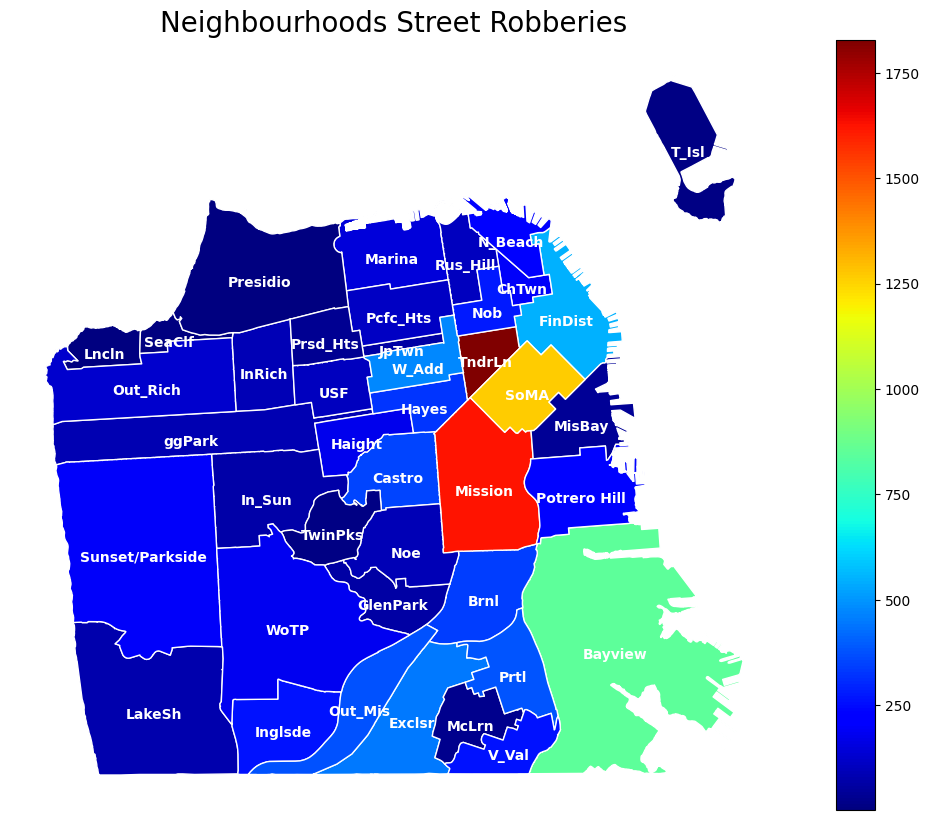

In [127]:
# create a map
ax3 = nbhd_map.plot(column = 'st_rob_incdts', cmap = 'jet', figsize = (15,10), legend = True, linewidth = 1, edgecolor = 'white')
# customise the map
ax3.axis('off')
ax3.set_title('Neighbourhoods Street Robberies', fontsize = 20, color = 'black')
for i in nbhd_map.index:
    coords = nbhd_map.geometry[i].centroid.coords[0]
    ax3.annotate(text = nbhd_map['abbr'][i], xy = coords, horizontalalignment = 'center', verticalalignment = 'top', color = 'white', fontweight = 'heavy')

plt.savefig('neighbourhood_robberies.png', transparent = True)

In [128]:
import plotly.graph_objs as go
import plotly.offline as py

# Assuming street_robs is a DataFrame containing street robbery data with a column 'Descript' representing the method of robbery

# Explore methods of street robberies
methods = street_robs['Descript'].value_counts()
method_labels = methods.index
method_values = methods.values

# Create a pie chart
pie_methods = go.Pie(labels=method_labels, values=method_values, hoverinfo='label+percent', textinfo='value', hole=0.67, rotation=160)
data = [pie_methods]

# Set layout for the pie chart
layout = go.Layout(height=650, showlegend=False, title=dict(text='Methods of <br> Street Robberies', x=0.5, y=0.5, font=dict(size=23)))

# Create figure
fig = go.Figure(data=data, layout=layout)

# Plot the figure
py.plot(fig, filename='street_robbery_methods.html', auto_open=True)

'street_robbery_methods.html'

In [129]:
pip install plotly

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


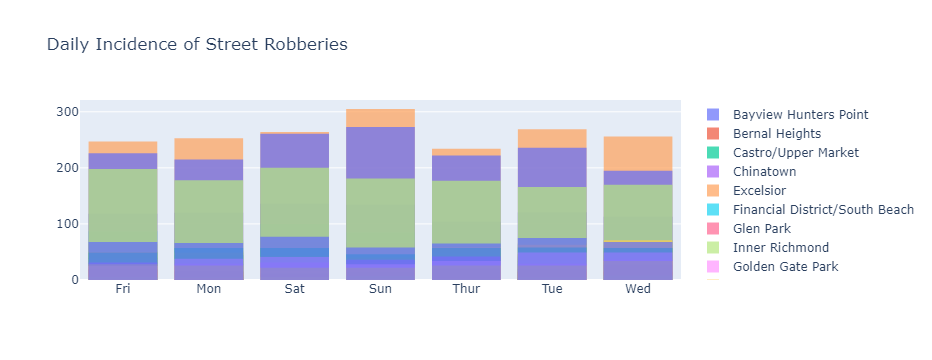

In [130]:
# explore the dialy trends within each neighborhood
neighbourhoods = pd.unique(street_robs['nhood'])
days = {'Monday':'Mon', 'Tuesday':'Tue', 'Wednesday':'Wed', 'Thursday':'Thur', 'Friday':'Fri', 'Saturday':'Sat', 'Sunday':'Sun'}
data = []
for i in range(len(neighbourhoods)):
    trace = go.Histogram(
        x = street_robs[street_robs['nhood'] == neighbourhoods[i]].sort_values('DayOfWeek')['DayOfWeek'].map(days),
        opacity = 0.7, name = neighbourhoods[i],
    )
    data.append(trace)
layout = go.Layout(
    title = 'Daily Incidence of Street Robberies',
    barmode = 'overlay'
)
fig = go.Figure(data, layout)
py.iplot(fig)

In [131]:
pip install nbformat>=4.2.0

Note: you may need to restart the kernel to use updated packages.


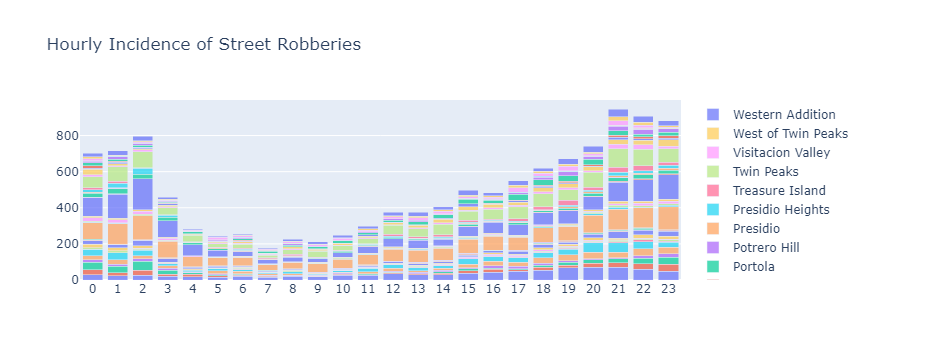

In [132]:
# explore hourly trends across neighbourhoods
neighbourhoods = pd.unique(street_robs['nhood'])
data = []

for i in range(len(neighbourhoods)):
    nbhd_hours = street_robs[street_robs['nhood'] == neighbourhoods[i]]['Hour'].value_counts()
    trace = go.Bar(
        x = nbhd_hours.index,
        y = nbhd_hours,
        opacity = 0.7,
        name = neighbourhoods[i],
    )
    data.append(trace)
layout = go.Layout(
    title = 'Hourly Incidence of Street Robberies',
    barmode = 'stack',
    xaxis = dict(dtick = 1),
    )
fig = go.Figure(data, layout)
py.iplot(fig)

In [133]:
# encode crime categories
le = preprocessing.LabelEncoder()
category = le.fit_transform(train['Category'])

In [134]:
# encode weekdays, districts and hours
district = pd.get_dummies(train['PdDistrict'])
days = pd.get_dummies(train['DayOfWeek'])
hour = train['Dates'].dt.hour
hour = pd.get_dummies(hour)

In [135]:
# pass encoded values to a new dataframe
enc_train = pd.concat([hour, days, district], axis = 1)
enc_train['Category'] = category

In [136]:
# add gps coordinates
enc_train['X'] = train['X']
enc_train['Y'] = train['Y']

In [137]:
# repeat data handling for test data by encoding weekdays, districts and hours
district = pd.get_dummies(test['PdDistrict'])
days = pd.get_dummies(test['DayOfWeek'])
hour = test['Dates'].dt.hour
hour = pd.get_dummies(hour)

In [138]:
# create a new dataframe for encoded test values
enc_test = pd.concat([hour, days, district], axis = 1)

In [139]:
# add gps coordinates
enc_test['X'] = test['X']
enc_test['Y'] = test['Y']

In [140]:
training, validation = train_test_split(enc_train, train_size = 0.60)

In [141]:
features = ['Friday', 'Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'BAYVIEW', 'CENTRAL', 'INGLESIDE', 'MISSION', 'NORTHERN', 'PARK', 'RICHMOND', 'SOUTHERN', 'TARAVAL', 'TENDERLOIN', 'X', 'Y']
# add the time to the feature
features.extend(x for x in range(0,24))

In [142]:
# Convert column names to strings
training_features = training[features]
training_features.columns = training_features.columns.astype(str)

# Initialize and fit the model
model = BernoulliNB()
model.fit(training_features, training['Category'])

# Similarly, convert column names to strings for validation features
validation_features = validation[features]
validation_features.columns = validation_features.columns.astype(str)

# Generate predicted probabilities
predicted = np.array(model.predict_proba(validation_features))

# Compute log loss
log_loss(validation['Category'], predicted)


2.582729354720687

In [143]:
from sklearn.linear_model import LogisticRegression

# Convert column names to strings for training features
training_features = training[features].copy()
training_features.columns = training_features.columns.astype(str)

# Initialize logistic regression model with reduced max_iter
model = LogisticRegression(C=0.01, max_iter=100)
model.fit(training_features, training['Category'])

# Convert column names to strings for validation features
validation_features = validation[features].copy()
validation_features.columns = validation_features.columns.astype(str)

# Generate predicted probabilities
predicted = model.predict_proba(validation_features)

# Compute log loss
log_loss(validation['Category'], predicted)


/home/u213931/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



2.6470772964631286

In [144]:
from sklearn.naive_bayes import BernoulliNB

# Convert column names to strings for training features
enc_train_features = enc_train[features].copy()
enc_train_features.columns = enc_train_features.columns.astype(str)

# Initialize Bernoulli Naive Bayes model
model = BernoulliNB()

# Fit the model to the training data
model.fit(enc_train_features, enc_train['Category'])

# Convert column names to strings for test features
enc_test_features = enc_test[features].copy()
enc_test_features.columns = enc_test_features.columns.astype(str)

# Generate predicted probabilities for the test set
predicted = model.predict_proba(enc_test_features)


## Accuracy of Logistic Regression

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Assuming you have your features and target variable ready

# Step 1: Split the data into training and test sets
X_train, X_val, label_train, label_val = train_test_split(X_res, y_res, test_size=0.10, random_state=42)

# Step 2: Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, label_train)

# Step 3: Make predictions on the test set
y_pred = model.predict(X_val)

# Step 4: Evaluate the model's accuracy
accuracy = accuracy_score(label_val, y_pred)
print("Accuracy:", accuracy)


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Assuming you have your features and target variable ready

# Step 1: Split the data into training and test sets
X_train, X_val, label_train, label_val = train_test_split(X_res, y_res, test_size=0.10, random_state=42)

# Step 2: Initialize and train the logistic regression model with reduced iterations
model = LogisticRegression(max_iter=50)  # Adjust max_iter as needed
model.fit(X_train, label_train)

# Step 3: Make predictions on the test set
y_pred = model.predict(X_val)

# Step 4: Evaluate the model's accuracy
accuracy = accuracy_score(label_val, y_pred)
print("Accuracy:", accuracy)


In [145]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
import numpy as np
# Generate some random data for testing
np.random.seed(42)
X = 2 * np.random.rand(100, 1)
y = (4 + 3 * X + np.random.randn(100, 1)) > 5  # Binary classification
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a logistic regression model
model = LogisticRegression()
# Train the model
model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)
# Evaluate the performance
accuracy = metrics.accuracy_score(y_test, y_pred)
precision = metrics.precision_score(y_test, y_pred)
recall = metrics.recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Accuracy: 0.8
Precision: 0.8888888888888888
Recall: 0.8888888888888888


/home/u213931/.local/lib/python3.9/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [146]:
# extract results
result = pd.DataFrame(predicted, columns = le.classes_)
result.to_csv('results.csv', index = True, index_label = 'Id')

In [147]:
result.head()

,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,...,SEX OFFENSES NON FORCIBLE,STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
0,0.006931,0.130749,0.000022,0.000927,0.029043,0.002050,0.006879,0.032834,0.005744,0.000202,...,0.000132,0.003629,0.000176,0.029831,6.388608e-07,0.003379,0.088487,0.119134,0.039165,0.022761
1,0.006931,0.130749,0.000022,0.000927,0.029043,0.002050,0.006879,0.032834,0.005744,0.000202,...,0.000132,0.003629,0.000176,0.029831,6.388608e-07,0.003379,0.088487,0.119134,0.039165,0.022761
2,0.001812,0.090249,0.000031,0.000222,0.038460,0.003725,0.008678,0.027551,0.007497,0.000230,...,0.000044,0.005854,0.000281,0.020437,1.780825e-07,0.003541,0.074799,0.085245,0.035091,0.008115
3,0.003013,0.123178,0.000023,0.000965,0.026901,0.001763,0.008916,0.018371,0.004883,0.000174,...,0.000147,0.003546,0.000354,0.026152,1.015323e-07,0.002376,0.098608,0.170747,0.024175,0.016035
4,0.003013,0.123178,0.000023,0.000965,0.026901,0.001763,0.008916,0.018371,0.004883,0.000174,...,0.000147,0.003546,0.000354,0.026152,1.015323e-07,0.002376,0.098608,0.170747,0.024175,0.016035


## Data Map

In [148]:
%%time
training , validation = train_test_split(features,train_size=0.70)
print(len(training) , len(validation))

30 13
CPU times: user 730 µs, sys: 23 µs, total: 753 µs
Wall time: 672 µs


In [149]:
import numpy as np
import pandas as pd
import string
import re 
from patsy import dmatrices

import matplotlib.pyplot as plt

import seaborn as sns
sns.set_style('whitegrid')

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import log_loss #evaluation metric

from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing

from datetime import datetime
from matplotlib.colors import LogNorm
from sklearn.metrics import accuracy_score,classification_report
from sklearn.decomposition import PCA

%matplotlib inline

In [150]:
import pandas as pd

# Define unique_counts function
def unique_counts():
    Ncat = len(pd.unique(SNF['Category'].ravel()))
    print("all " + str(Ncat) + " categories:")
    print(pd.unique(SNF['Category'].ravel()))
    print('-' * 100)

    Ndist = len(pd.unique(SNF['PdDistrict'].ravel()))
    print("all " + str(Ndist) + " districts:")
    print(pd.unique(SNF['PdDistrict'].ravel()))

    print('-' * 100)
    Nd = len(pd.unique(SNF['DayOfWeek'].ravel()))
    print("all " + str(Nd) + " dayofweek:")
    print(pd.unique(SNF['DayOfWeek'].ravel()))

    print('-' * 100)
    Ndis = len(pd.unique(SNF['Resolution'].ravel()))
    print("all " + str(Ndis) + " Resolution:")
    print(pd.unique(SNF['Resolution'].ravel()))

# Read the CSV file
SNF = pd.read_csv("train.csv", sep=',')

# Print the size of the DataFrame
print('Size of data frame: ', SNF.shape)

# Call the unique_counts function
unique_counts()


Size of data frame:  (878049, 9)
all 39 categories:
['WARRANTS' 'OTHER OFFENSES' 'LARCENY/THEFT' 'VEHICLE THEFT' 'VANDALISM'
 'NON-CRIMINAL' 'ROBBERY' 'ASSAULT' 'WEAPON LAWS' 'BURGLARY'
 'SUSPICIOUS OCC' 'DRUNKENNESS' 'FORGERY/COUNTERFEITING' 'DRUG/NARCOTIC'
 'STOLEN PROPERTY' 'SECONDARY CODES' 'TRESPASS' 'MISSING PERSON' 'FRAUD'
 'KIDNAPPING' 'RUNAWAY' 'DRIVING UNDER THE INFLUENCE'
 'SEX OFFENSES FORCIBLE' 'PROSTITUTION' 'DISORDERLY CONDUCT' 'ARSON'
 'FAMILY OFFENSES' 'LIQUOR LAWS' 'BRIBERY' 'EMBEZZLEMENT' 'SUICIDE'
 'LOITERING' 'SEX OFFENSES NON FORCIBLE' 'EXTORTION' 'GAMBLING'
 'BAD CHECKS' 'TREA' 'RECOVERED VEHICLE' 'PORNOGRAPHY/OBSCENE MAT']
----------------------------------------------------------------------------------------------------
all 10 districts:
['NORTHERN' 'PARK' 'INGLESIDE' 'BAYVIEW' 'RICHMOND' 'CENTRAL' 'TARAVAL'
 'TENDERLOIN' 'MISSION' 'SOUTHERN']
----------------------------------------------------------------------------------------------------
all 7 dayofweek:


In [151]:
#reading the training data set
SNF = pd.read_csv("train.csv" , sep=',')
# names=['Dates','Category','Descript','DayOfWeek','PdDistrict','Resolution','Address','X','Y']

# printing size of data frame
print ('Size of data frame: ',SNF.shape)

Size of data frame:  (878049, 9)


In [152]:
# defining a function to find missing values
def count_missing(frame):
    return (frame.shape[0] * frame.shape[1]) - frame.count().sum()
# checking for missing values in data frame
print ('Missing Values: ', count_missing(SNF))

Missing Values:  0


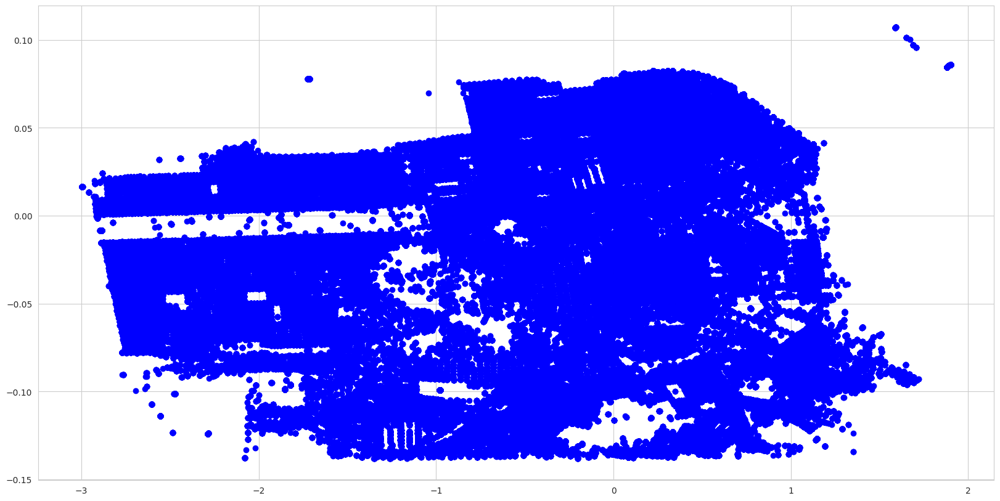

In [153]:
scaler = preprocessing.StandardScaler()
scaler.fit(SNF[["X","Y"]])
SNF[["X","Y"]] = scaler.transform(SNF[["X","Y"]])

SNF=SNF[abs(SNF["Y"])<100]
SNF.index=range(len(SNF))

plt.figure(figsize=(20,10))
plt.plot(SNF["X"],SNF["Y"],'bo')
plt.show()

<Axes: xlabel='Category'>

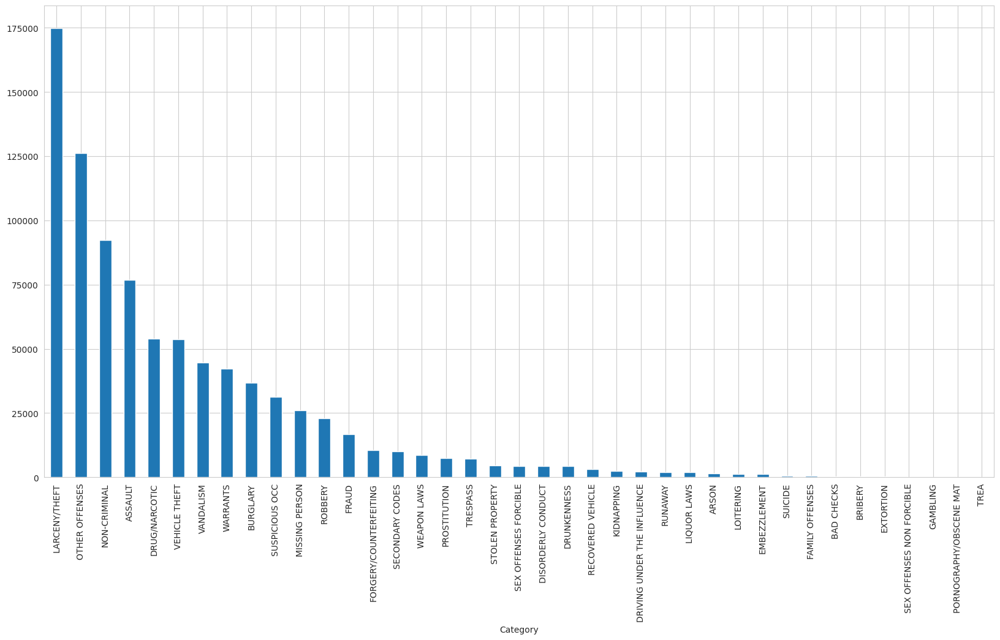

In [154]:
plt.figure(figsize=(20,10))
SNF.Category.value_counts().plot(kind='bar')

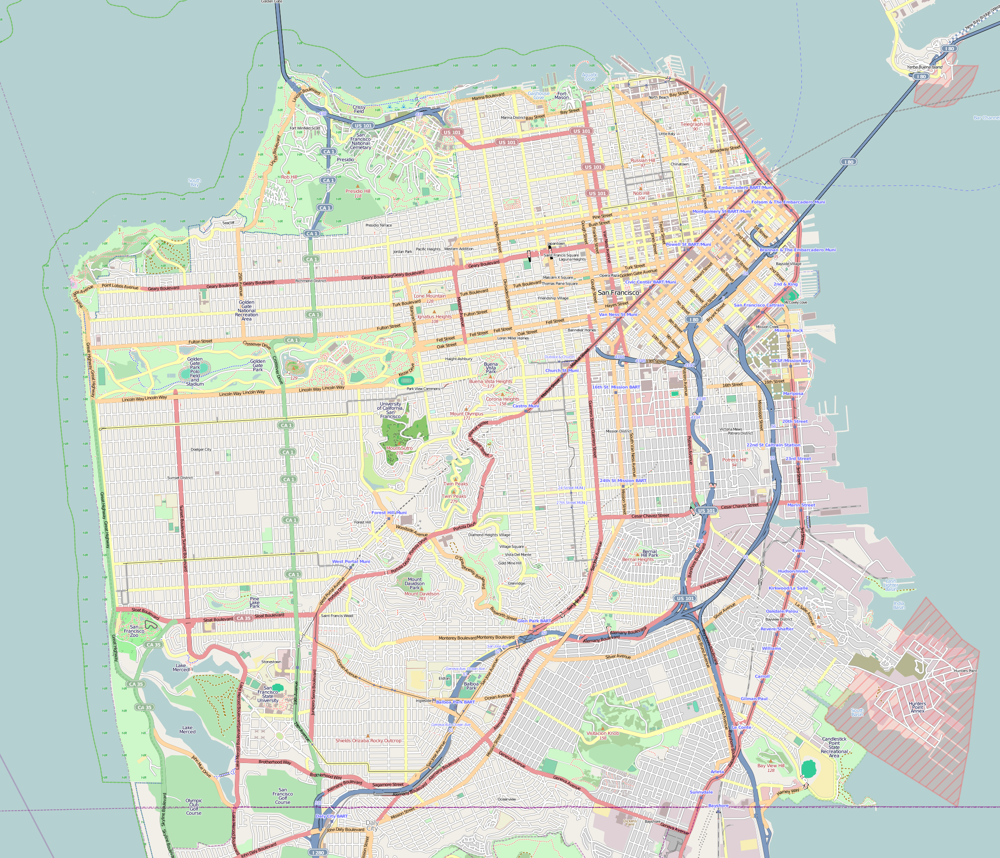

In [155]:
# Taking only the X,Y cordinates and plotting them on google
from IPython.core.display import Image
Image('Location_map_San_Francisco_County.png',width=900,height=100)

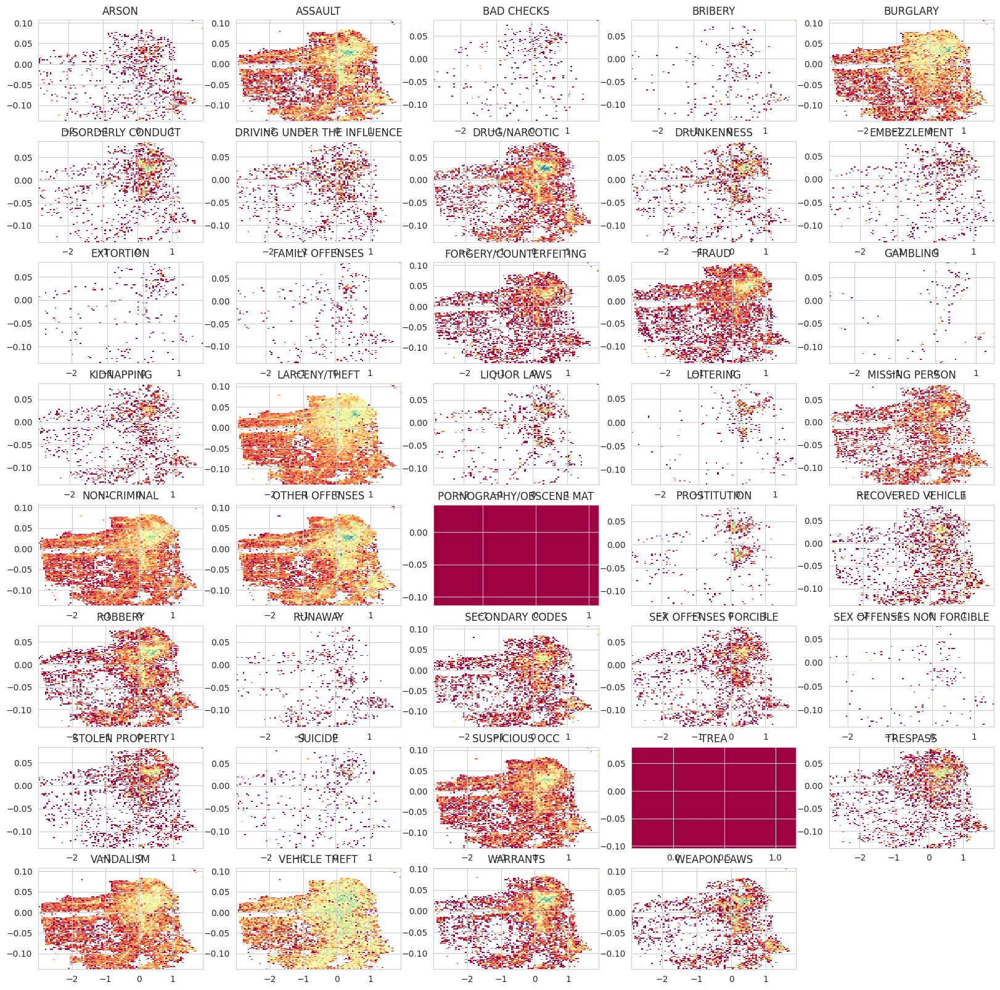

In [156]:
# 2D histogram of the response variable: Category
binX=100
binY=100
cat = SNF.groupby('Category')
i=1
plt.figure(figsize=(20, 20))
for name, group in cat:
    plt.subplot(8,5,i)
    histo, xedges, yedges = np.histogram2d(np.array(group.X),np.array(group.Y), bins=(binX,binY))
    
    plt.imshow(histo.T,origin='lower',cmap=plt.cm.Spectral,extent=[xedges[0],xedges[-1],yedges[0],\
               yedges[-1]],interpolation='nearest',aspect='auto',norm=LogNorm())
    plt.title(name)
    i+=1
del cat

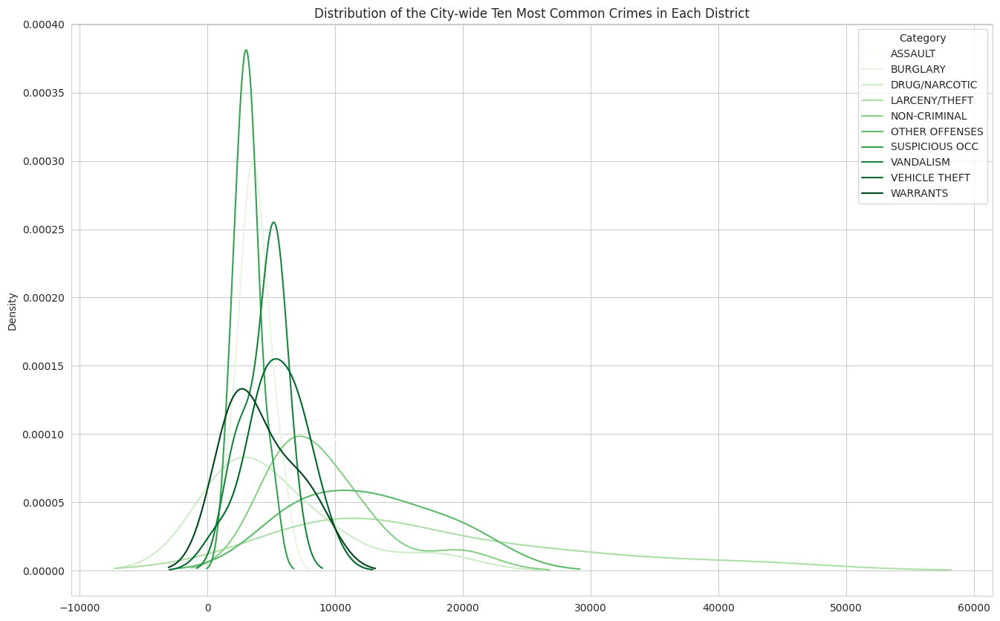

In [157]:
#Distribution of the City-wide Ten Most Common Crimes in Each District
ten_most_common = SNF[SNF['Category'].isin(SNF['Category'].value_counts().head(10).index)]

ten_most_crime_by_district = pd.crosstab(ten_most_common['PdDistrict'], ten_most_common['Category'])
ten_most_crime_by_district.plot(kind='kde', figsize=(16,10), stacked=True, colormap='Greens',
                                title='Distribution of the City-wide Ten Most Common Crimes in Each District')
plt.show()

In [158]:
def unique_counts():
    Ncat=len(pd.unique(SNF.Category.ravel()))
    print ("all "+str(Ncat)+" categories:")
    print (pd.unique(SNF.Category.ravel()))
    print('-'*100)

    Ndist=len(pd.unique(SNF.PdDistrict.ravel()))
    print ("all "+str(Ndist)+" districts:")
    print (pd.unique(SNF.PdDistrict.ravel()))

    print('-'*100)
    Nd=len(pd.unique(SNF.DayOfWeek.ravel()))
    print ("all "+str(Nd)+" dayofweek:")
    print (pd.unique(SNF.DayOfWeek.ravel()))

    print('-'*100)
    Nds=len(pd.unique(SNF.PdDistrict.ravel()))
    print ("all "+str(Nds)+" PdDistrict:")
    print (pd.unique(SNF.PdDistrict.ravel()))
    print('-'*100)

    Ndis=len(pd.unique(SNF.Resolution.ravel()))
    print ("all "+str(Ndis)+" Resolution:")
    print (pd.unique(SNF.Resolution.ravel()))

unique_counts()

all 39 categories:
['WARRANTS' 'OTHER OFFENSES' 'LARCENY/THEFT' 'VEHICLE THEFT' 'VANDALISM'
 'NON-CRIMINAL' 'ROBBERY' 'ASSAULT' 'WEAPON LAWS' 'BURGLARY'
 'SUSPICIOUS OCC' 'DRUNKENNESS' 'FORGERY/COUNTERFEITING' 'DRUG/NARCOTIC'
 'STOLEN PROPERTY' 'SECONDARY CODES' 'TRESPASS' 'MISSING PERSON' 'FRAUD'
 'KIDNAPPING' 'RUNAWAY' 'DRIVING UNDER THE INFLUENCE'
 'SEX OFFENSES FORCIBLE' 'PROSTITUTION' 'DISORDERLY CONDUCT' 'ARSON'
 'FAMILY OFFENSES' 'LIQUOR LAWS' 'BRIBERY' 'EMBEZZLEMENT' 'SUICIDE'
 'LOITERING' 'SEX OFFENSES NON FORCIBLE' 'EXTORTION' 'GAMBLING'
 'BAD CHECKS' 'TREA' 'RECOVERED VEHICLE' 'PORNOGRAPHY/OBSCENE MAT']
----------------------------------------------------------------------------------------------------
all 10 districts:
['NORTHERN' 'PARK' 'INGLESIDE' 'BAYVIEW' 'RICHMOND' 'CENTRAL' 'TARAVAL'
 'TENDERLOIN' 'MISSION' 'SOUTHERN']
----------------------------------------------------------------------------------------------------
all 7 dayofweek:
['Wednesday' 'Tuesday' 'Monday' '

In [159]:
#getting the column names
SNF.columns.values

array(['Dates', 'Category', 'Descript', 'DayOfWeek', 'PdDistrict',
       'Resolution', 'Address', 'X', 'Y'], dtype=object)

In [160]:
#getting head of data set
SNF.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.107902,0.007832
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.107902,0.007832
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-0.057541,0.064335
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-0.144262,0.065338
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-0.531112,0.001140


In [161]:
#getting tail of data set
SNF.tail()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
877977,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-1.199747,-0.124677
877978,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-0.815292,-0.085518
877979,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,0.633404,0.020235
877980,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,1.057042,0.020983
877981,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Monday,BAYVIEW,NONE,1800 Block of NEWCOMB AV,0.912272,-0.071808


In [162]:
#checking data frame info
SNF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 877982 entries, 0 to 877981
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       877982 non-null  object 
 1   Category    877982 non-null  object 
 2   Descript    877982 non-null  object 
 3   DayOfWeek   877982 non-null  object 
 4   PdDistrict  877982 non-null  object 
 5   Resolution  877982 non-null  object 
 6   Address     877982 non-null  object 
 7   X           877982 non-null  float64
 8   Y           877982 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


In [163]:
#length of each words in the category column
def word_length(SNF):
    SNF['CategoryLength'] = SNF['Category'].apply(len)
    return SNF.head()

In [164]:
word_length(SNF)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,CategoryLength
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.107902,0.007832,8
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.107902,0.007832,14
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-0.057541,0.064335,14
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-0.144262,0.065338,13
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-0.531112,0.001140,13


<Axes: ylabel='Frequency'>

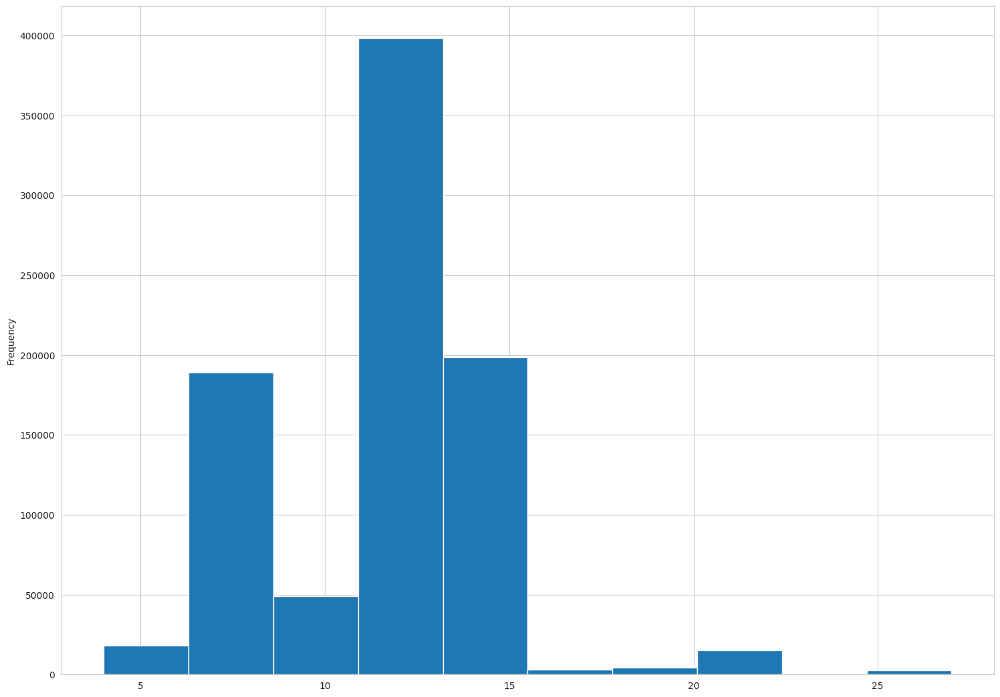

In [165]:
SNF['CategoryLength'].plot(bins=10,kind="hist")

In [166]:
#category length statistics
SNF['CategoryLength'].describe()

count    877982.000000
mean         11.741599
std           3.123013
min           4.000000
25%           9.000000
50%          13.000000
75%          14.000000
max          27.000000
Name: CategoryLength, dtype: float64

In [167]:
#category of length 27 : max
SNF[SNF['CategoryLength']==27]

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,CategoryLength
351,2015-05-13 00:56:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Wednesday,TARAVAL,"ARREST, BOOKED",19TH AV / WAWONA ST,-1.735261,-0.073469,27
1437,2015-05-03 02:17:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Sunday,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,0.651236,0.010593,27
1507,2015-05-02 23:10:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Saturday,BAYVIEW,"ARREST, BOOKED",WILLIAMS AV / VENUS ST,0.808527,-0.089696,27
1610,2015-05-02 19:00:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Saturday,RICHMOND,"ARREST, BOOKED",7TH AV / CLEMENT ST,-1.412588,0.025977,27
1658,2015-05-02 16:56:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Saturday,BAYVIEW,"ARREST, BOOKED",25TH ST / ILLINOIS ST,1.179553,-0.039682,27
...,...,...,...,...,...,...,...,...,...,...
875799,2003-01-11 00:31:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF DRUGS,Saturday,NORTHERN,"ARREST, BOOKED",TURK ST / VAN NESS AV,0.065052,0.023945,27
876195,2003-01-10 02:23:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Friday,NORTHERN,"ARREST, BOOKED",ELLIS ST / LARKIN ST,0.161632,0.028926,27
876196,2003-01-10 02:09:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Friday,SOUTHERN,"ARREST, BOOKED",BRYANT ST / 10TH ST,0.424255,-0.001471,27
876603,2003-01-09 02:11:00,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Thursday,SOUTHERN,"ARREST, BOOKED",GOLDEN GATE AV / TAYLOR ST,0.405979,0.024536,27


In [168]:
#count number Driving under the influence
len(SNF[SNF['CategoryLength']==27])

2268

In [169]:
# category of length 4 : min
SNF[SNF['CategoryLength']==4]

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,CategoryLength
21002,2015-02-03 17:05:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Tuesday,BAYVIEW,NONE,300 Block of 20TH ST,1.202872,-0.022604,4
93716,2014-02-17 06:38:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Monday,MISSION,"ARREST, BOOKED",500 Block of CASTRO ST,-0.407804,-0.023968,4
107733,2013-11-30 05:59:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Saturday,NORTHERN,"ARREST, BOOKED",700 Block of POLK ST,0.110894,0.027986,4
192190,2012-10-20 22:27:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Saturday,BAYVIEW,NONE,1300 Block of ARMSTRONG AV,1.152957,-0.103930,4
316490,2010-12-31 16:20:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Friday,CENTRAL,"ARREST, BOOKED",2300 Block of STOCKTON ST,0.393857,0.079685,4
337880,2010-09-09 11:55:00,TREA,TRESPASSING OR LOITERING NEAR POSTED INDUSTRIA...,Thursday,BAYVIEW,NONE,1000 Block of IOWA ST,1.018273,-0.037533,4


In [170]:
#count number of Trespassing or Loitering near posted industrial
len(SNF[SNF['CategoryLength']==4])

6

array([[<Axes: title={'center': 'BAYVIEW'}>,
        <Axes: title={'center': 'CENTRAL'}>,
        <Axes: title={'center': 'INGLESIDE'}>],
       [<Axes: title={'center': 'MISSION'}>,
        <Axes: title={'center': 'NORTHERN'}>,
        <Axes: title={'center': 'PARK'}>],
       [<Axes: title={'center': 'RICHMOND'}>,
        <Axes: title={'center': 'SOUTHERN'}>,
        <Axes: title={'center': 'TARAVAL'}>],
       [<Axes: title={'center': 'TENDERLOIN'}>, <Axes: >, <Axes: >]],
      dtype=object)

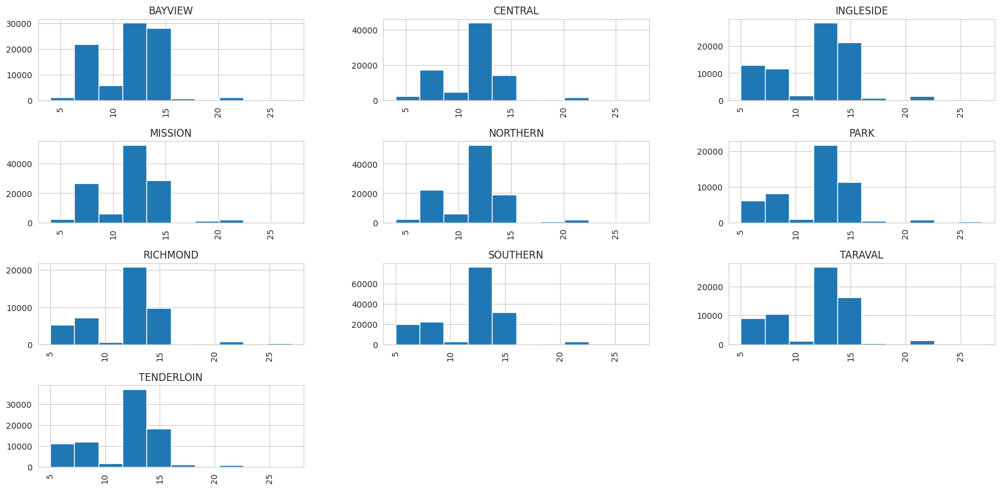

In [171]:
SNF.hist(column='CategoryLength',by=SNF['PdDistrict'],bins=10,figsize=(20,10))

In [172]:
#group by address and category
A_C_counts=SNF.groupby(["Address"]).size()
A_C_counts

Address
0 Block of  HARRISON ST     1
0 Block of 10TH AV          5
0 Block of 10TH ST         49
0 Block of 11TH ST         48
0 Block of 12TH AV          7
                           ..
ZENO PL / FOLSOM ST         3
ZOE ST / BRANNAN ST        10
ZOE ST / BRYANT ST         10
ZOE ST / FREELON ST         4
ZOE ST / WELSH ST           3
Length: 23191, dtype: int64

In [173]:
#plt.figure(figsize=(20,10))
#sns.boxplot(x=SNF["year"], y=SNF["month"],data=SNF, palette="Set3",whis=1.5)

In [174]:
# getting unique counts : DayOfWeek column
day = SNF['DayOfWeek'].unique()
day_dict = {value:index for index,value in enumerate(day)}
dy = SNF['DayOfWeek'].map(day_dict)
day_dict

{'Wednesday': 0,
 'Tuesday': 1,
 'Monday': 2,
 'Sunday': 3,
 'Saturday': 4,
 'Friday': 5,
 'Thursday': 6}

/home/u213931/tmp/ipykernel_3239276/2374246479.py:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='DayOfWeek', ylabel='Density'>

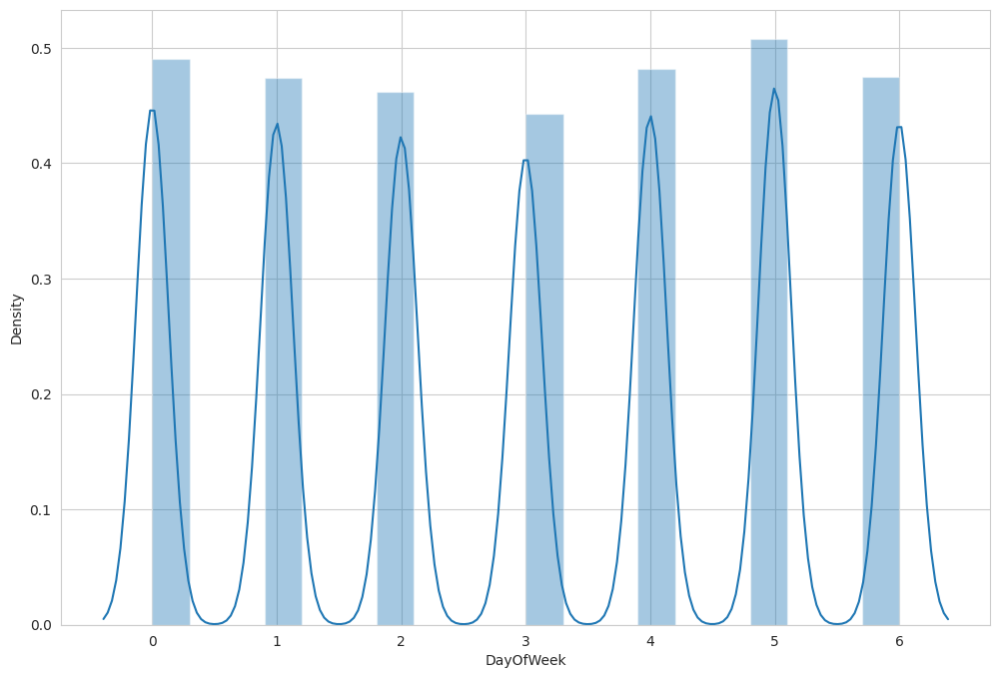

In [175]:
#draw histogram of the distribution of PdDistrict
plt.figure(figsize=(12,8))
sns.distplot(dy,bins=20,kde=True)

In [176]:
# getting unique counts : Category column
district = SNF['PdDistrict'].unique()
district_dict = {value:index for index,value in enumerate(district)}
d = SNF['PdDistrict'].map(district_dict)
district_dict


{'NORTHERN': 0,
 'PARK': 1,
 'INGLESIDE': 2,
 'BAYVIEW': 3,
 'RICHMOND': 4,
 'CENTRAL': 5,
 'TARAVAL': 6,
 'TENDERLOIN': 7,
 'MISSION': 8,
 'SOUTHERN': 9}

/home/u213931/tmp/ipykernel_3239276/3093048253.py:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='PdDistrict', ylabel='Density'>

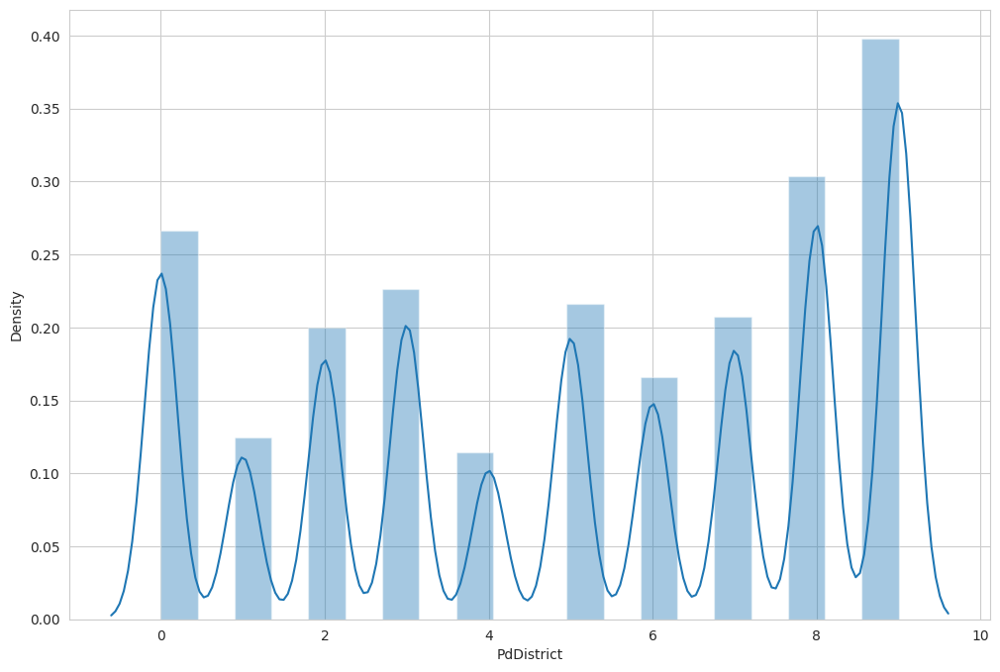

In [177]:
#draw histogram of the distribution of PdDistrict
plt.figure(figsize=(12,8))
sns.distplot(d,bins=20,kde=True)

In [178]:
# getting unique counts : Category column
categories = SNF['Category'].unique()
category_dict = {value:index for index,value in enumerate(categories)}
y = SNF['Category'].map(category_dict)
category_dict

{'WARRANTS': 0,
 'OTHER OFFENSES': 1,
 'LARCENY/THEFT': 2,
 'VEHICLE THEFT': 3,
 'VANDALISM': 4,
 'NON-CRIMINAL': 5,
 'ROBBERY': 6,
 'ASSAULT': 7,
 'WEAPON LAWS': 8,
 'BURGLARY': 9,
 'SUSPICIOUS OCC': 10,
 'DRUNKENNESS': 11,
 'FORGERY/COUNTERFEITING': 12,
 'DRUG/NARCOTIC': 13,
 'STOLEN PROPERTY': 14,
 'SECONDARY CODES': 15,
 'TRESPASS': 16,
 'MISSING PERSON': 17,
 'FRAUD': 18,
 'KIDNAPPING': 19,
 'RUNAWAY': 20,
 'DRIVING UNDER THE INFLUENCE': 21,
 'SEX OFFENSES FORCIBLE': 22,
 'PROSTITUTION': 23,
 'DISORDERLY CONDUCT': 24,
 'ARSON': 25,
 'FAMILY OFFENSES': 26,
 'LIQUOR LAWS': 27,
 'BRIBERY': 28,
 'EMBEZZLEMENT': 29,
 'SUICIDE': 30,
 'LOITERING': 31,
 'SEX OFFENSES NON FORCIBLE': 32,
 'EXTORTION': 33,
 'GAMBLING': 34,
 'BAD CHECKS': 35,
 'TREA': 36,
 'RECOVERED VEHICLE': 37,
 'PORNOGRAPHY/OBSCENE MAT': 38}

/home/u213931/tmp/ipykernel_3239276/125828955.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Category', ylabel='Density'>

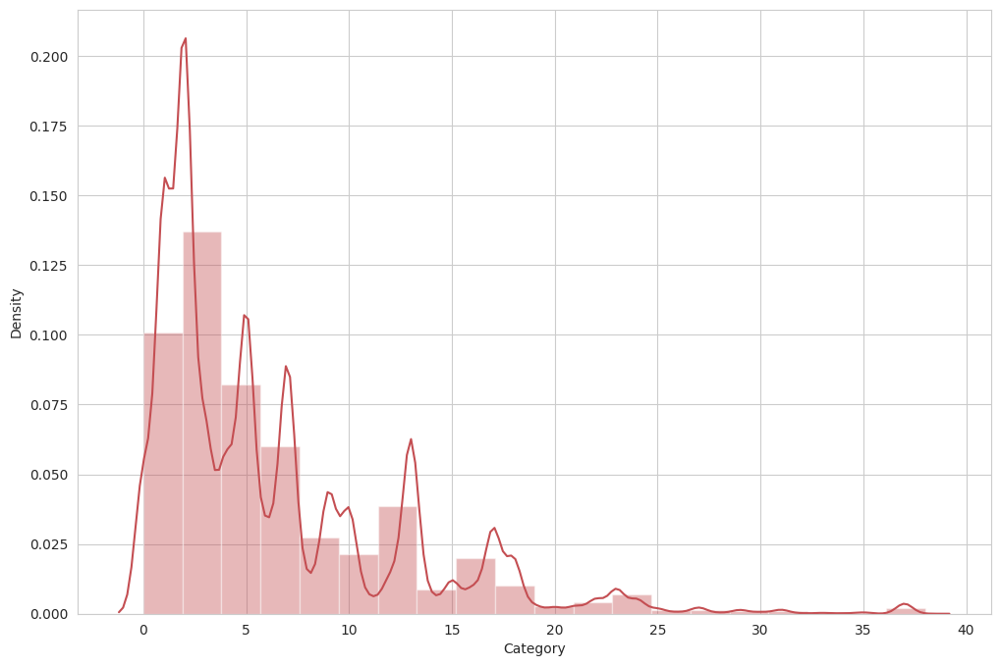

In [179]:
#draw histogram of the distribution of the response variable: y
plt.figure(figsize=(12,8))
sns.set_color_codes()
sns.distplot(y,bins=20,kde=True,color='r')

## MODEL BUILDING

In [180]:
# Read test data
def loading_test_data():
    test = pd.read_csv("test.csv")
    return test

In [181]:
loading_test_data().head()

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [182]:
# Recode the Response variable 
category = preprocessing.LabelEncoder()
category_crime = category.fit_transform(SNF.Category)
print(category_crime)

[37 21 21 ... 16 35 12]


In [183]:
category.inverse_transform(category_crime)

array(['WARRANTS', 'OTHER OFFENSES', 'OTHER OFFENSES', ...,
       'LARCENY/THEFT', 'VANDALISM', 'FORGERY/COUNTERFEITING'],
      dtype=object)

In [184]:
category.classes_

array(['ARSON', 'ASSAULT', 'BAD CHECKS', 'BRIBERY', 'BURGLARY',
       'DISORDERLY CONDUCT', 'DRIVING UNDER THE INFLUENCE',
       'DRUG/NARCOTIC', 'DRUNKENNESS', 'EMBEZZLEMENT', 'EXTORTION',
       'FAMILY OFFENSES', 'FORGERY/COUNTERFEITING', 'FRAUD', 'GAMBLING',
       'KIDNAPPING', 'LARCENY/THEFT', 'LIQUOR LAWS', 'LOITERING',
       'MISSING PERSON', 'NON-CRIMINAL', 'OTHER OFFENSES',
       'PORNOGRAPHY/OBSCENE MAT', 'PROSTITUTION', 'RECOVERED VEHICLE',
       'ROBBERY', 'RUNAWAY', 'SECONDARY CODES', 'SEX OFFENSES FORCIBLE',
       'SEX OFFENSES NON FORCIBLE', 'STOLEN PROPERTY', 'SUICIDE',
       'SUSPICIOUS OCC', 'TREA', 'TRESPASS', 'VANDALISM', 'VEHICLE THEFT',
       'WARRANTS', 'WEAPON LAWS'], dtype=object)

In [185]:
#feature normalization
def normalize(data): 
    data = (data - data.min()) / (data.max() - data.min())
    return data

SNF['X'] = normalize(SNF.X)
SNF['Y'] = normalize(SNF.Y)

In [186]:
def parse_time(x):
    DD=datetime.strptime(x,"%Y-%m-%d %H:%M:%S")
    time=DD.hour
    day=DD.day
    month=DD.month
    year=DD.year
    return time, day, month, year

#getting season : summer, fall, winter, spring from months column
def get_season(x):
    summer=0
    fall=0
    winter=0
    spring=0
    if (x in [5, 6, 7]):
        summer=1
    if (x in [8, 9, 10]):
        fall=1
    if (x in [11, 0, 1]):
        winter=1
    if (x in [2, 3, 4]):
        spring=1
    return summer, fall, winter, spring

In [187]:
def preprocess_data(df):
    """
    Preprocessing Training/Testing Data 
    """
    feature_list=df.columns.tolist()
    if "Descript" in feature_list:
        feature_list.remove("Descript")
    if "Resolution" in feature_list:
        feature_list.remove("Resolution")
    if "Category" in feature_list:
        feature_list.remove("Category")
    if "Id" in feature_list:
        feature_list.remove("Id")
    cleanData=df[feature_list]
    cleanData.index=range(len(df))
    
    print ("Parsing dates...")
    cleanData["Time"], cleanData["Day"], cleanData["Month"], cleanData["Year"]=zip(*cleanData["Dates"].apply(parse_time))
    
    print ("Creating season features...")
    cleanData["Summer"], cleanData["Fall"], cleanData["Winter"], cleanData["Spring"]=zip(*cleanData["Month"].apply(get_season))
    
    print("Creating Lat/Long feature...")
    xy_scaler = preprocessing.StandardScaler()
    xy_scaler.fit(cleanData[["X","Y"]])
    cleanData[["X","Y"]] = xy_scaler.transform(cleanData[["X","Y"]])
    #set outliers to 0
    cleanData["X"]=cleanData["X"].apply(lambda x: 0 if abs(x)>5 else x)
    cleanData["Y"]=cleanData["Y"].apply(lambda y: 0 if abs(y)>5 else y)
    
    print ("Creating address features...")
    #recoding address as 0: if no interaction , 1: if interaction
    cleanData["Addr"]=cleanData["Address"].apply(lambda x: 1 if "/" in x else 0)
    
    print ("Creating dummy variables...")
    PD = pd.get_dummies(cleanData['PdDistrict'], prefix='PD')
    DAYOfWeek = pd.get_dummies(cleanData["DayOfWeek"], prefix='WEEK')
    TIME = pd.get_dummies(cleanData['Time'],prefix='HOUR')
    Day = pd.get_dummies(cleanData['Day'],prefix='DAY')
    Month = pd.get_dummies(cleanData['Month'],prefix='MONTH')
    Year = pd.get_dummies(cleanData['Year'],prefix='YEAR')
    
    feature_list=cleanData.columns.tolist()
    
    print ("Joining features...")
    features = pd.concat([cleanData[feature_list],PD,DAYOfWeek,TIME,Day,Month,Year],axis=1)
    
    print ("Droping processed columns...")
    cleanFeatures=features.drop(["PdDistrict","DayOfWeek","Address","Dates","Time","Day","Month","Year"],\
                                axis=1,inplace=False)
    
    print('Done!')
    
    return cleanFeatures

In [188]:
%%time
features = preprocess_data(SNF)

Parsing dates...


/home/u213931/tmp/ipykernel_3239276/3711266271.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/u213931/tmp/ipykernel_3239276/3711266271.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Creating season features...
Creating Lat/Long feature...
Creating address features...
Creating dummy variables...
Joining features...
Droping processed columns...
Done!
CPU times: user 13.3 s, sys: 397 ms, total: 13.7 s
Wall time: 9.58 s


In [189]:
features['crime'] = category_crime
features.head()

,X,Y,CategoryLength,Summer,Fall,Winter,Spring,Addr,PD_BAYVIEW,PD_CENTRAL,...,YEAR_2007,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015,crime
0,-0.123732,0.313018,8,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,37
1,-0.123732,0.313018,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,21
2,-0.063274,1.381346,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,21
3,-0.167381,1.400312,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16
4,-0.631787,0.186493,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16


In [190]:
features.tail()

,X,Y,CategoryLength,Summer,Fall,Winter,Spring,Addr,PD_BAYVIEW,PD_CENTRAL,...,YEAR_2007,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015,crime
877977,-1.434470,-2.192394,7,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,25
877978,-0.972939,-1.452002,13,0,0,1,0,0,False,False,...,False,False,False,False,False,False,False,False,False,16
877979,0.766191,0.547534,13,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,16
877980,1.274761,0.561666,9,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,35
877981,1.100967,-1.192781,22,0,0,1,0,0,True,False,...,False,False,False,False,False,False,False,False,False,12


In [191]:
features.to_csv('features.csv')

In [192]:
#print features column names
collist=features.columns.tolist()
collist

['X',
 'Y',
 'CategoryLength',
 'Summer',
 'Fall',
 'Winter',
 'Spring',
 'Addr',
 'PD_BAYVIEW',
 'PD_CENTRAL',
 'PD_INGLESIDE',
 'PD_MISSION',
 'PD_NORTHERN',
 'PD_PARK',
 'PD_RICHMOND',
 'PD_SOUTHERN',
 'PD_TARAVAL',
 'PD_TENDERLOIN',
 'WEEK_Friday',
 'WEEK_Monday',
 'WEEK_Saturday',
 'WEEK_Sunday',
 'WEEK_Thursday',
 'WEEK_Tuesday',
 'WEEK_Wednesday',
 'HOUR_0',
 'HOUR_1',
 'HOUR_2',
 'HOUR_3',
 'HOUR_4',
 'HOUR_5',
 'HOUR_6',
 'HOUR_7',
 'HOUR_8',
 'HOUR_9',
 'HOUR_10',
 'HOUR_11',
 'HOUR_12',
 'HOUR_13',
 'HOUR_14',
 'HOUR_15',
 'HOUR_16',
 'HOUR_17',
 'HOUR_18',
 'HOUR_19',
 'HOUR_20',
 'HOUR_21',
 'HOUR_22',
 'HOUR_23',
 'DAY_1',
 'DAY_2',
 'DAY_3',
 'DAY_4',
 'DAY_5',
 'DAY_6',
 'DAY_7',
 'DAY_8',
 'DAY_9',
 'DAY_10',
 'DAY_11',
 'DAY_12',
 'DAY_13',
 'DAY_14',
 'DAY_15',
 'DAY_16',
 'DAY_17',
 'DAY_18',
 'DAY_19',
 'DAY_20',
 'DAY_21',
 'DAY_22',
 'DAY_23',
 'DAY_24',
 'DAY_25',
 'DAY_26',
 'DAY_27',
 'DAY_28',
 'DAY_29',
 'DAY_30',
 'DAY_31',
 'MONTH_1',
 'MONTH_2',
 'MONTH_3

In [193]:
features.head(10)

,X,Y,CategoryLength,Summer,Fall,Winter,Spring,Addr,PD_BAYVIEW,PD_CENTRAL,...,YEAR_2007,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015,crime
0,-0.123732,0.313018,8,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,37
1,-0.123732,0.313018,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,21
2,-0.063274,1.381346,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,21
3,-0.167381,1.400312,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16
4,-0.631787,0.186493,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16
5,0.771649,-2.218282,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16
6,-0.022298,-1.733799,13,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,True,36
7,2.036376,-1.633403,13,1,0,0,0,1,True,False,...,False,False,False,False,False,False,False,False,True,36
8,-3.378776,0.395894,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,True,16
9,0.145365,1.687050,13,1,0,0,0,1,False,True,...,False,False,False,False,False,False,False,False,True,16


In [194]:
features.tail(10)

,X,Y,CategoryLength,Summer,Fall,Winter,Spring,Addr,PD_BAYVIEW,PD_CENTRAL,...,YEAR_2007,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015,crime
877972,0.081927,0.974253,14,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,21
877973,0.343682,-0.635228,7,0,0,1,0,0,False,False,...,False,False,False,False,False,False,False,False,False,1
877974,-1.986259,0.642168,14,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,21
877975,1.304915,-1.509271,7,0,0,1,0,0,True,False,...,False,False,False,False,False,False,False,False,False,1
877976,1.304915,-1.509271,14,0,0,1,0,0,True,False,...,False,False,False,False,False,False,False,False,False,21
877977,-1.434470,-2.192394,7,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,25
877978,-0.972939,-1.452002,13,0,0,1,0,0,False,False,...,False,False,False,False,False,False,False,False,False,16
877979,0.766191,0.547534,13,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,16
877980,1.274761,0.561666,9,0,0,1,0,1,False,False,...,False,False,False,False,False,False,False,False,False,35
877981,1.100967,-1.192781,22,0,0,1,0,0,True,False,...,False,False,False,False,False,False,False,False,False,12


## Principal Components Analysis

[8.64333528e-01 7.21777164e-02 9.32980705e-03 6.93830684e-03
 2.59361434e-03 2.54797652e-03 2.02528435e-03 1.58081262e-03
 1.17015918e-03 1.13790976e-03 1.10243727e-03 1.08475350e-03
 1.06984924e-03 1.05175462e-03 1.01073427e-03 9.72935457e-04
 8.16054741e-04 7.06070224e-04 6.93855017e-04 6.72721142e-04]


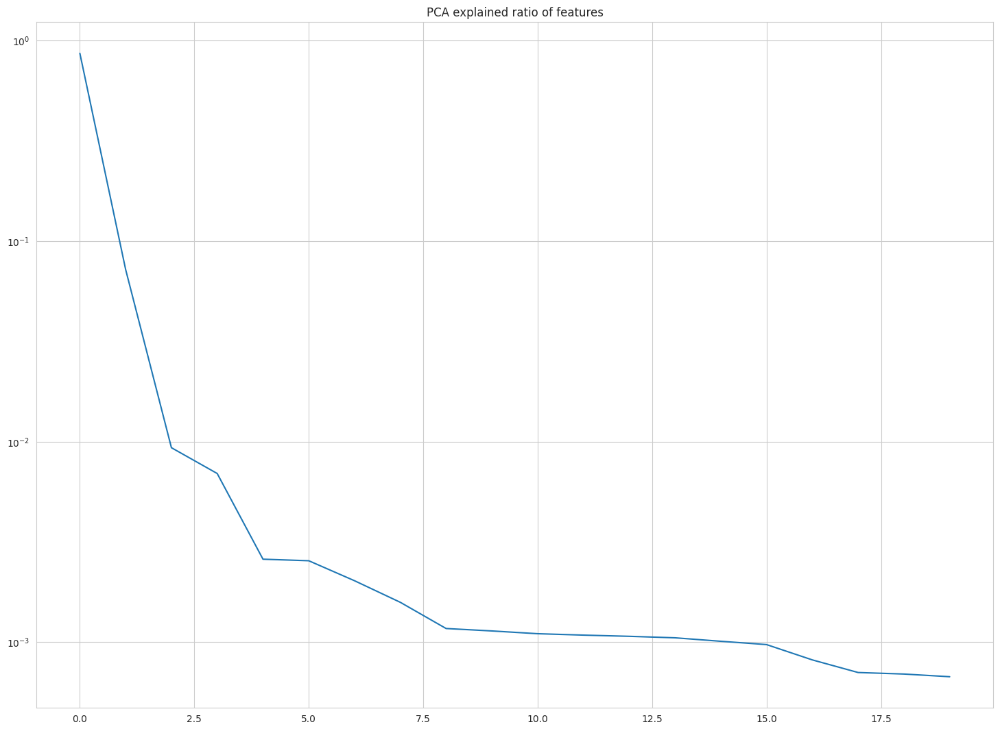

In [195]:
new_PCA=PCA(n_components=20)
new_PCA.fit(features)
plt.plot(new_PCA.explained_variance_ratio_)
plt.yscale('log')
plt.title("PCA explained ratio of features")
print (new_PCA.explained_variance_ratio_)

Text(0.5, 1.0, 'cumsum of PCA explained ratio')

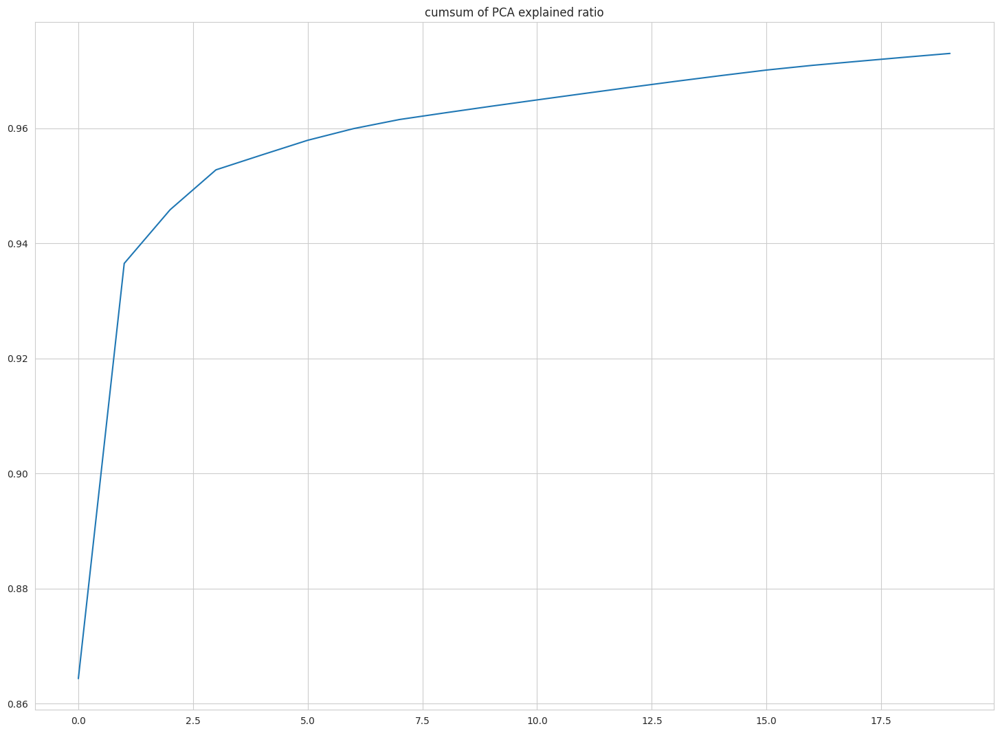

In [196]:
plt.plot(new_PCA.explained_variance_ratio_.cumsum())
plt.title("cumsum of PCA explained ratio")

In [197]:
features[collist[:-1]].head()

,X,Y,CategoryLength,Summer,Fall,Winter,Spring,Addr,PD_BAYVIEW,PD_CENTRAL,...,YEAR_2006,YEAR_2007,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015
0,-0.123732,0.313018,8,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,False,True
1,-0.123732,0.313018,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,False,True
2,-0.063274,1.381346,14,1,0,0,0,1,False,False,...,False,False,False,False,False,False,False,False,False,True
3,-0.167381,1.400312,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,False,True
4,-0.631787,0.186493,13,1,0,0,0,0,False,False,...,False,False,False,False,False,False,False,False,False,True


## RANDOM FOREST

In [198]:
%%time
training , validation = train_test_split(features,train_size=0.70)
print(len(training) , len(validation))

614587 263395
CPU times: user 317 ms, sys: 4.16 ms, total: 321 ms
Wall time: 318 ms


In [199]:
%%time
print ("Training the random forest...")
# Initialize a Random Forest classifier 
forest = RandomForestClassifier(n_estimators=10) 
# This may take a few minutes to run
y_score = forest.fit(training[collist[:-1]],training['crime'])

Training the random forest...
CPU times: user 25.8 s, sys: 1.14 s, total: 27 s
Wall time: 19.1 s


In [200]:
predicted = np.array(forest.predict_proba(validation[collist[:-1]]))

#evaluation metric : cross-entropy loss.
log_loss(validation['crime'], predicted) 

2.6419564778448255

In [201]:
cv_scores = cross_val_score(forest,training[collist[:-1]],training['crime'])
print(cv_scores)

/home/u213931/.local/lib/python3.9/site-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 3 members, which is less than n_splits=5.



[0.71991083 0.71239363 0.7314692  0.71794788 0.71165095]


In [202]:
from sklearn.metrics import classification_report

In [203]:
# Take the mean accuracy across all cross validation segments.
print('Cross Validation Accuracy: ', cv_scores.mean())

Cross Validation Accuracy:  0.7186745001839239


In [204]:
predict = forest.predict_proba(training[collist[:-1]])

#Write results
result=pd.DataFrame(predict, columns=category.classes_)
result.to_csv('submit.csv', index = True, index_label = 'Id' )

In [205]:
import numpy as np

# Assuming X and y are your feature dataset and target variable dataset, respectively

# Reduce y to match the number of samples in X
y_reduced = y[:100]  # Assuming y is a numpy array

# Now X and y_reduced should have the same number of samples
print("Shape of X:", X.shape)
print("Shape of y_reduced:", y_reduced.shape)


Shape of X: (100, 1)
Shape of y_reduced: (100,)


In [206]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Assuming X_train, y_train are your training features and labels
# Assuming X_test, y_test are your test features and labels

# Create a random forest classifier
rf_classifier = RandomForestClassifier()

# Train the classifier
rf_classifier.fit(X_train,y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Accuracy: 0.75
Precision: 0.9333333333333333
Recall: 0.7777777777777778


/home/u213931/tmp/ipykernel_3239276/479073364.py:13: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



## Decision Tree

In [232]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import category_encoders as ce
from sklearn.metrics import accuracy_score
from matplotlib import pyplot as plt

In [233]:
import pickle

In [234]:
# Specify the path to your CSV file
csv_file_path = 'train.csv'

In [235]:
# Import necessary libraries
import pandas as pd

# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

In [236]:
df.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [237]:
df.isnull().sum()
#We can see that there are no missing values in the dataset

Dates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64

In [240]:
X_train, X_val, label_train, label_val = train_test_split(X_res, y_res, test_size=0.10, random_state=42)

In [241]:
X_train.shape,X_val.shape

((6118105, 105), (679790, 105))

In [215]:
X_train.dtypes

X            float64
Y            float64
year_2004       bool
year_2005       bool
year_2006       bool
              ...   
Turk           int64
Eddy           int64
DR             int64
Ellis          int64
Ofarrell       int64
Length: 105, dtype: object

In [216]:
X_train.head()

,X,Y,year_2004,year_2005,year_2006,year_2007,year_2008,year_2009,year_2010,year_2011,...,Mission,Market,Bryant,RD,Geary,Turk,Eddy,DR,Ellis,Ofarrell
387075,0.488425,0.819298,False,False,False,False,False,True,False,False,...,0,0,0,0,0,0,0,0,0,0
640277,0.611849,0.522482,False,False,True,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
5642041,0.517814,0.790239,True,False,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
5237686,0.614395,0.516912,False,False,False,False,False,False,True,False,...,0,0,0,0,0,0,0,0,0,0
3097333,0.877051,0.222336,False,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0


In [217]:
# encoding process in categorical columns
import category_encoders as ce

In [218]:
# Create a Decision Tree Classifier with the "entropy" criterion
clf = DecisionTreeClassifier(criterion="entropy")

In [219]:
# Train the classifier on the training set
clf.fit(X_train, label_train)

DecisionTreeClassifier(criterion='entropy')

In [221]:
# Make predictions on the testing set
y_pred = clf.predict(X_val)

In [222]:
# print the scores on training and test set
print('Training set score: {:.4f}'.format(clf.score(X_train, label_train)))
print('Test set score: {:.4f}'.format(clf.score(X_val, label_val)))

Training set score: 0.9811
Test set score: 0.7925


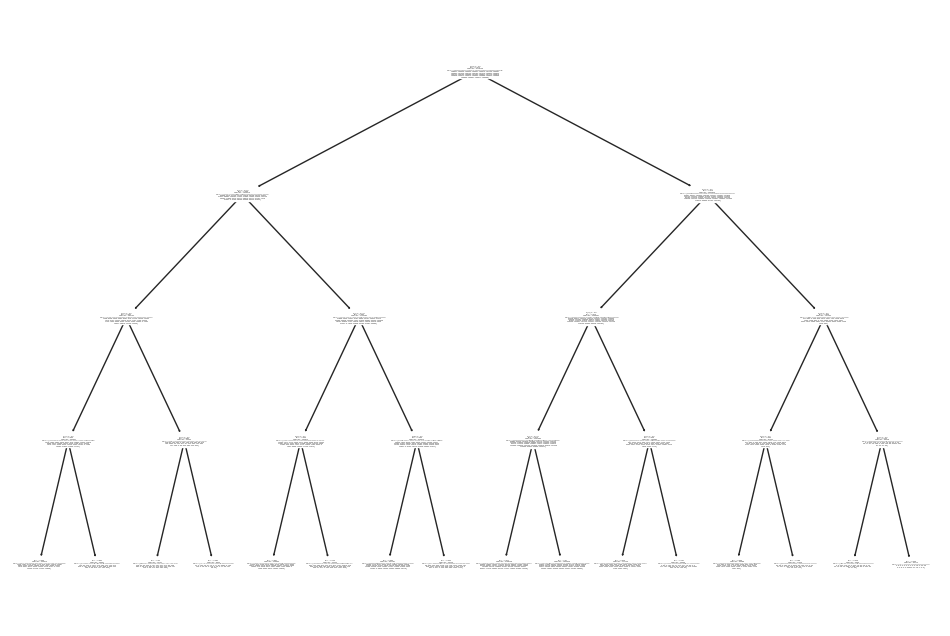

In [223]:
import matplotlib.pyplot as plt
from sklearn import tree

# Create decision tree classifier with limited depth
clf = tree.DecisionTreeClassifier(max_depth=4)

# Fit the classifier on the training data
clf.fit(X_train, label_train)

# Plot the decision tree
plt.figure(figsize=(12, 8))
tree.plot_tree(clf)
plt.show()


In [245]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming X_train, label_train are your training features and labels
# Assuming X_test, y_test are your test features and labels

# Train the classifier
#clf.fit(X_train, label_train)

# Make predictions on the validation set
y_pred = clf.predict(X_val)

# Calculate accuracy, precision, and recall
accuracy = accuracy_score(label_val, y_pred)
precision = precision_score(label_val, y_pred, average='weighted')  # Specify average='weighted' for multiclass
recall = recall_score(label_val, y_pred, average='weighted')  # Specify average='weighted' for multiclass

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Accuracy: 0.801585783845011
Precision: 0.7961231393599238
Recall: 0.801585783845011
